# **RECONOCIMIENTO DE LENGUA DE SIGNOS ESPAÑOLA MEDIANTE DEEP LEARNING**



***Trabajo Fin de Grado realizado por Marta Guirao Alcaraz, para la Universidad Carlos III de Madrid, 2023***

Some code was obtained from Franco Exequiel Schüler (2022), '*SignRecognition.ipynb*', *link to code:* https://colab.research.google.com/drive/1Yyhz01Pz4u3k3R9mYPI8B32wwKvsmVmq#scrollTo=307f8f6f, from his TFG: '*Reconocimiento de Lenguaje de Señas mediante Deep Learning*', Universidad Carlos III de Madrid

# Recursos utilizados


Code obtained from Anirudh Chandupatla (Aug 3, 2018), '*colab system specs.ipynb*', *link to creator:* https://stackoverflow.com/a/51664404, *link to code:* https://colab.research.google.com/drive/151805XTDg--dgHb3-AXJCpnWaqRhop_2#scrollTo=ojGuEt8MpJhA

In [ ]:
!cat /etc/*release

DISTRIB_ID=Ubuntu
DISTRIB_RELEASE=20.04
DISTRIB_CODENAME=focal
DISTRIB_DESCRIPTION="Ubuntu 20.04.5 LTS"
NAME="Ubuntu"
VERSION="20.04.5 LTS (Focal Fossa)"
ID=ubuntu
ID_LIKE=debian
PRETTY_NAME="Ubuntu 20.04.5 LTS"
VERSION_ID="20.04"
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
VERSION_CODENAME=focal
UBUNTU_CODENAME=focal


In [ ]:
# GPU activity
!nvidia-smi

Thu Jun  8 10:51:04 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# PU count and name
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-0b390299-912c-8fce-b72e-1462969f7a11)


In [ ]:
# GPU model name
!lscpu | grep 'Model name'

Model name:                      Intel(R) Xeon(R) CPU @ 2.20GHz


In [ ]:
#no.of cores each processor is having
!lscpu | grep 'Core(s) per socket:'

Core(s) per socket:              1


In [ ]:
#no.of threads each core is having
!lscpu | grep 'Thread(s) per core'

Thread(s) per core:              2


In [ ]:
#memory that we can use
!free -h --si | awk  '/Mem:/{print $2}'

12G


In [ ]:
#hard disk space that we can use
!df -h / | awk '{print $4}'

Avail
55G


In [ ]:
#no.of sockets i.e available slots for physical processors
!lscpu | grep 'Socket(s):'

Socket(s):                       1


In [ ]:
!lscpu | grep "L3 cache"

L3 cache:                        55 MiB


In [ ]:
#if it had turbo boost it would've shown Min and Max MHz also but it is only showing current frequency this means it always operates at shown frequency
!lscpu | grep "MHz"

CPU MHz:                         2199.998


# Import dependencies and utilities

In [1]:
!pip3 install opencv-python matplotlib
!pip3 install mediapipe
!pip3 install tensorflow
!pip3 install tensorboard
!pip3 install pandas
!pip install -U scikit-learn


[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
from IPython.display import display, Image
#from google.colab.patches import cv2_imshow

from PIL import Image

import io
import os
import cv2
import time
import PIL
import html
import math
import shutil
import datetime
import numpy as np
import pandas as pd
import mediapipe as mp
import matplotlib.pyplot as plt


In [3]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Variables

In [4]:
mp_holistic = mp.solutions.holistic
mp_drawing = mp.solutions.drawing_utils

In [5]:
ROOT_PATH = "/content/drive/MyDrive/TFG"
SOURCE_PATH = ROOT_PATH + "/videos_f"
FRAMES_PATH = ROOT_PATH + "/frames_r"
DATASET_PATH = ROOT_PATH + "/dataset"
CAM_DATASET_PATH = ROOT_PATH + "/dataset_cam"
CAM_DATASET_PATH_EXT = ROOT_PATH + "/dataset_cam_2"
GENERATED_DATA_PATH = ROOT_PATH + "/dataset_syn"
MAX_FRAME_LENGTH = 45
DESIRED_HEIGHT = 480
DESIRED_WIDTH = 720

In [6]:
NUM_POSE_LANDMARKS = 33 * 4 # 33 landmarks. 3 coordinates and 1 visibility attribute per landmark
NUM_FACE_LANDMARKS = 468 * 3 # 468 landmarks. 3 coordinates per landmark
NUM_LEFT_HAND_LANDMARKS = 21 * 3 # 21 landmarks. 3 coordinates per landmark
NUM_RIGHT_HAND_LANDMARKS = 21 * 3 # 21 landmarks. 3 coordinates per landmark
TOTAL_LANDMARKS = NUM_POSE_LANDMARKS + NUM_FACE_LANDMARKS + NUM_LEFT_HAND_LANDMARKS + NUM_RIGHT_HAND_LANDMARKS

#Functions

In [19]:

def resize_and_show(description, image):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  #cv2_imshow(img)
  cv2.imshow(description, img)

In [20]:
# detection(img, model): This function process an image and make predictions about what detects (hands, face, pose)
#     img: The image we want to process
#     model: The model that will make the predictions

def detection(img, model):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Color conversion to RGB
    img.flags.writeable = False
    results = model.process(img) # Image processing
    img.flags.writeable = True
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) # Back to original color (BGR)
    return img, results

In [29]:
# show_landmarks(img, results): This function show the conections and landmarks of face, hands and pose. Also adds styles.
#     img: The image we want to process
#     results: Results given by the predictor

def show_landmarks(img, results):
    mp_drawing.draw_landmarks(
        img, results.face_landmarks, mp_holistic.FACEMESH_TESSELATION,
        mp_drawing.DrawingSpec(color=(0,0,255), thickness=1, circle_radius=1),
        mp_drawing.DrawingSpec(color=(10,255,0), thickness=1, circle_radius=1)
    )
    mp_drawing.draw_landmarks(
        img, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
         mp_drawing.DrawingSpec(color=(0,0,255), thickness=2, circle_radius=1),
         mp_drawing.DrawingSpec(color=(234,232,24), thickness=2, circle_radius=2)
    )
    mp_drawing.draw_landmarks(
        img, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
         mp_drawing.DrawingSpec(color=(0,0,255), thickness=2, circle_radius=1),
         mp_drawing.DrawingSpec(color=(228,19,206), thickness=2, circle_radius=2)
    )
    mp_drawing.draw_landmarks(
        img, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS,
         mp_drawing.DrawingSpec(color=(0,0,255), thickness=2, circle_radius=1),
         mp_drawing.DrawingSpec(color=(228,19,206), thickness=2, circle_radius=2)
    )
    #resize_and_show("Ensenando landmarks",img)
    #resize_and_show(img)

In [22]:
# get_landmarks(results): This function returns the conections and landmarks of face, hands and pose.
#     results: Results given by the predictor

def get_landmarks(results):

    # Face
    face = []
    if results.face_landmarks:
        for result in results.face_landmarks.landmark:
            landmark = [result.x, result.y, result.z]
            face.append(landmark)
        face = np.array(face).flatten()
    else:
        face = np.zeros(NUM_FACE_LANDMARKS)
    face = np.array(face).flatten()

    # Pose
    pose = []
    if results.pose_landmarks:
        for result in results.pose_landmarks.landmark:
            landmark = [result.x, result.y, result.z, result.visibility]
            pose.append(landmark)
        pose = np.array(pose).flatten()
    else:
        pose = np.zeros(NUM_POSE_LANDMARKS)
    pose = np.array(pose).flatten()

    #Left hand
    left_hand = []
    if results.left_hand_landmarks:
        for result in results.left_hand_landmarks.landmark:
            landmark = [result.x, result.y, result.z]
            left_hand.append(landmark)
    else:
        left_hand = np.zeros(NUM_LEFT_HAND_LANDMARKS)
    left_hand = np.array(left_hand).flatten()

    # Right hand
    right_hand = []
    if results.right_hand_landmarks:
        for result in results.right_hand_landmarks.landmark:
            landmark = [result.x, result.y, result.z]
            right_hand.append(landmark)
    else:
        right_hand = np.zeros(NUM_RIGHT_HAND_LANDMARKS)
    right_hand = np.array(right_hand).flatten()

    # Return all landmarks concatenated
    return np.concatenate([face, pose, left_hand, right_hand])

In [23]:
# Creating training file
def train_file(dataframe, signs, name_df):

  for sign in signs:
    videos = os.listdir(os.path.join(DATASET_PATH, sign))
    videos.sort()
    videos.sort(key=len)
    clase = [label_map[sign] for i in range(45)]

    videos_train = videos[16:30] + videos[31:40] + videos[41:50] + videos[51:60] + videos[61:70] + videos[71:80] + videos[81:90] + videos[91:100] + videos[101:110] + videos[111:115]

    for video in videos_train:
      df = pd.read_csv(os.path.join(DATASET_PATH, sign, video), header=None)
      df = df.drop(df.columns[[-1]], axis='columns')
      df['clase'] = clase
      dataframe = pd.concat([dataframe, df], axis=0)

  try:
      os.makedirs(os.path.join(DATASET_PATH, name_df))
  except:
      pass

  print(dataframe.shape)
  dataframe.to_csv(os.path.join(DATASET_PATH, name_df, name_df + '_train.csv'), header=False, index=False)

In [24]:
# Creating validation file
def val_file(dataframe, signs, name_df):

  for sign in signs:
    videos = os.listdir(os.path.join(DATASET_PATH, sign))
    videos.sort()
    videos.sort(key=len)
    clase = [label_map[sign] for i in range(45)]

    videos_val = videos[13:16] + [videos[30]] + [videos[40]] + [videos[50]] + [videos[60]] + [videos[70]] + [videos[80]] + [videos[90]] + [videos[100]] + [videos[110]] + videos[127:]

    for video in videos_val:
      df = pd.read_csv(os.path.join(DATASET_PATH, sign, video), header=None)
      df = df.drop(df.columns[[-1]], axis='columns')
      df['clase'] = clase
      dataframe = pd.concat([dataframe, df], axis=0)
  try:
      os.makedirs(os.path.join(DATASET_PATH, name_df))
  except:
      pass

  print(dataframe.shape)
  dataframe.to_csv(os.path.join(DATASET_PATH, name_df, name_df + '_val.csv'), header=False, index=False)

In [25]:
# Creating test file
def test_file(dataframe, signs, name_df):

  for sign in signs:
    videos = os.listdir(os.path.join(DATASET_PATH, sign))
    videos.sort()
    videos.sort(key=len)
    videos_test = videos[:13] + videos[115:127]
    clase = [label_map[sign] for i in range(45)]

    for video in videos_test:
      #print(video)
      df = pd.read_csv(os.path.join(DATASET_PATH, sign, video), header=None)
      df = df.drop(df.columns[[-1]], axis='columns')
      df['clase'] = clase
      dataframe = pd.concat([dataframe, df], axis=0)

  try:
      os.makedirs(os.path.join(DATASET_PATH, name_df))
  except:
      pass

  print(dataframe.shape)
  dataframe.to_csv(os.path.join(DATASET_PATH, name_df, name_df + '_test.csv'), header=False, index=False)

# Taking videos for training

Testing camera

In [ ]:

capture = cv2.VideoCapture(0)

if capture.isOpened() is False: print("Camera is not available")

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic: # Setting mediapipe model
    while capture.isOpened():

        # Read frames and show them
        _, frame = capture.read()

        # Model results prediction
        img, results = detection(frame, holistic)

        # Show landmarks
        show_landmarks(img, results)

        cv2.imshow("OpenCV video", img)

        if cv2.waitKey(1) == ord("q"):
            break
    capture.release()
    cv2.destroyAllWindows()


Capturing videos

In [ ]:
signs = os.listdir(os.path.join(os.getcwd(), 'videos'))
signs.sort()
print(signs)
num_videos = 10
num_videos_act = 30

In [ ]:
camera = cv2.VideoCapture(0)

if camera.isOpened() is False:
    print("Camera is not available.")
else:
    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic: # Setting mediapipe model
        for sign in signs:
            for video in range(num_videos_act, num_videos_act + num_videos):
                for video_frame in range(MAX_FRAME_LENGTH):

                    # Read frames and show
                    _, frame = camera.read()

                    # Model results prediction
                    img, results = detection(frame, holistic)

                    # Show landmarks
                    show_landmarks(img, results)

                    # Capture funtionality
                    if video_frame==0:
                        cv2.rectangle(img, (0,0), (DESIRED_WIDTH, DESIRED_HEIGHT), (255, 255, 255), -1)
                        cv2.putText(img, 'Comenzando captura de {} Video [{}]'
                                    .format(sign.upper(), str(video)), (3,30), cv2.FONT_HERSHEY_SIMPLEX, .75, (0,0,0), 1, cv2.LINE_AA)

                        resize_and_show('Sign Language Recognition', img)
                        cv2.waitKey(2000) # Wait 2sec
                    else:
                        resize_and_show('Sign Language Recognition', img)

                    # Landmarks saving
                    all_landmarks = get_landmarks(results)

                    try:
                      os.makedirs(os.path.join(os.getcwd(),'dataset', sign, sign + str(video)))
                    except:
                      pass

                    path = os.path.join(os.getcwd(),'dataset', sign, sign + str(video), str(video_frame))
                    np.save(path, all_landmarks)

                    if cv2.waitKey(1) == ord('q'):
                        camera.release()
                        cv2.destroyAllWindows()
                        break


        camera.release()
        cv2.destroyAllWindows()

Obtaining dataset from landmarks saved

In [ ]:
signs = os.listdir(os.path.join(SOURCE_PATH))

In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'abril': 0,
 'adios': 1,
 'agosto': 2,
 'atencion': 3,
 'bien': 4,
 'bienvenido': 5,
 'boca': 6,
 'buenas_noches': 7,
 'buenas_tardes': 8,
 'buenos_dias': 9,
 'cabeza': 10,
 'cara': 11,
 'ceja': 12,
 'como_estas': 13,
 'cuanto_tiempo': 14,
 'de_nada': 15,
 'diciembre': 16,
 'encantado': 17,
 'enero': 18,
 'enhorabuena': 19,
 'espana': 20,
 'febrero': 21,
 'gato': 22,
 'gracias': 23,
 'hambre': 24,
 'hasta_manana': 25,
 'hola': 26,
 'igualmente': 27,
 'julio': 28,
 'junio': 29,
 'lengua_de_signos': 30,
 'mal': 31,
 'marzo': 32,
 'mayo': 33,
 'nariz': 34,
 'nos_vemos': 35,
 'noviembre': 36,
 'octubre': 37,
 'ojo': 38,
 'oreja': 39,
 'parque': 40,
 'pelo': 41,
 'perdon': 42,
 'perro': 43,
 'pestana': 44,
 'playa': 45,
 'por_favor': 46,
 'regular': 47,
 'sed': 48,
 'septiembre': 49}

In [ ]:
# Code to remove documents ending in .csv
"""
for sign in [signs[37]]:
  try:
    files = os.listdir(os.path.join(CAM_DATASET_PATH, sign))
    for name in files:
      if name.endswith(".csv"):
        print(name)
        os.remove(os.path.join(CAM_DATASET_PATH, sign, name))
  except:
    continue
"""

In [ ]:
# Creating csv files for each video taken

for sign in [signs[42]]:
  videos = os.listdir(os.path.join(CAM_DATASET_PATH_EXT, sign))
  videos.sort()
  videos.sort(key=len)
  print(videos)
  for video in videos[71:86]:
    frames = os.listdir(os.path.join(CAM_DATASET_PATH_EXT, sign, video))
    frames.sort()
    frames.sort(key=len)
    for frame in frames:
      landmarks = np.load(os.path.join(CAM_DATASET_PATH_EXT, sign, video, frame))
      landmarks = np.append(landmarks, label_map[sign])
      landmarks = np.reshape(landmarks,(-1, 1663))
      #print(landmarks)
      with open(os.path.join(CAM_DATASET_PATH_EXT, sign, video + ".csv"),'a') as csvfile:
        np.savetxt(csvfile, landmarks, delimiter=',', fmt='%.8f')


['pelo15', 'pelo16', 'pelo17', 'pelo18', 'pelo19', 'pelo20', 'pelo21', 'pelo22', 'pelo23', 'pelo24', 'pelo25', 'pelo26', 'pelo27', 'pelo28', 'pelo29', 'pelo30', 'pelo31', 'pelo32', 'pelo33', 'pelo34', 'pelo35', 'pelo36', 'pelo37', 'pelo38', 'pelo39', 'pelo40', 'pelo41', 'pelo42', 'pelo43', 'pelo44', 'pelo45', 'pelo46', 'pelo47', 'pelo48', 'pelo49', 'pelo50', 'pelo51', 'pelo52', 'pelo53', 'pelo54', 'pelo55', 'pelo56', 'pelo57', 'pelo58', 'pelo59', 'pelo60', 'pelo61', 'pelo62', 'pelo63', 'pelo64', 'pelo65', 'pelo66', 'pelo67', 'pelo68', 'pelo69', 'pelo70', 'pelo71', 'pelo72', 'pelo73', 'pelo74', 'pelo75', 'pelo76', 'pelo77', 'pelo78', 'pelo79', 'pelo80', 'pelo81', 'pelo82', 'pelo83', 'pelo84', 'pelo85', 'pelo86', 'pelo87', 'pelo88', 'pelo89', 'pelo90', 'pelo91', 'pelo92', 'pelo93', 'pelo94', 'pelo95', 'pelo96', 'pelo97', 'pelo98', 'pelo99', 'pelo100', 'pelo101', 'pelo102', 'pelo103', 'pelo104', 'pelo105', 'pelo106', 'pelo107', 'pelo108', 'pelo109', 'pelo110', 'pelo111', 'pelo112', 'pelo1

In [ ]:
# Moving files from one dataset to the other

for sign in signs:
  try:
    files = os.listdir(os.path.join(CAM_DATASET_PATH_EXT, sign))
    for name in files:
      if name.endswith(".csv"):
        print(name)
        shutil.move(os.path.join(CAM_DATASET_PATH_EXT, sign, name), os.path.join(DATASET_PATH, sign))
  except:
    continue


pelo86.csv
pelo87.csv
pelo88.csv
pelo89.csv
pelo90.csv
pelo91.csv
pelo92.csv
pelo93.csv
pelo94.csv
pelo95.csv
pelo96.csv
pelo97.csv
pelo98.csv
pelo99.csv
pelo100.csv


In [ ]:
# Rename files
"""
for sign in [signs[36]]:
  files = os.listdir(os.path.join(DATASET_PATH, sign))

  for file in files:
    new_file_name = ""

    file_path = os.path.join(DATASET_PATH, sign, file)

    # Extract the number from the file name
    file_name, file_extension = os.path.splitext(os.path.basename(file_path))
    print(file_name)
    try:
      number = int(file_name[-2:]) # assuming the number is always the last two characters in the file name
    except:
      number = 0

    if number == 30:

      # Decrement the number by one
      new_number = number - 1

      # Construct the new file name with the decremented number
      new_file_name = file_name[:-2] + str(new_number) + file_extension

      print(new_file_name)

      # Rename the file
      os.rename(file_path, os.path.join(os.path.dirname(file_path), new_file_name))
"""

# Obtaining frames from videos


In [ ]:
signs = os.listdir(os.path.join(SOURCE_PATH))

In [ ]:


# Saving frames from one video
"""
cap = cv2.VideoCapture("/content/drive/MyDrive/TFG/videos_f/cabeza/cabeza13.mov")
count = 0
while cap.isOpened():
  ret, frame = cap.read()
  if not ret:
    break
  cv2.imwrite("/content/drive/MyDrive/TFG/frames_r/cabeza/cabeza13/cabeza13" + str(count) + ".png", frame)
  count += 1
cap.release()
cv2.destroyAllWindows()

"""
# Saving frames from all the videos
for sign in signs:
    videos = os.listdir(os.path.join(SOURCE_PATH, sign))
    print(videos)
    for video_index, video in enumerate(videos):
        count = 0
        video_path = os.path.join(SOURCE_PATH, sign, video)
        print(video_path)
        cap = cv2.VideoCapture(video_path)
        while (cap.isOpened()):
          ret, frame = cap.read()
          if not ret:
            break
          cv2.imwrite(os.path.join(FRAMES_PATH, sign, video[:-4], video[:-4]) + str(count) + '.png', frame)
          count += 1
        cap.release()
        cv2.destroyAllWindows()


# Creating dataset with landmarks


In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

In [ ]:
# Storing landmarks from each frame of each video in dataset

for sign in signs:
    videos = os.listdir(os.path.join(FRAMES_PATH, sign))
    try:
      os.makedirs(os.path.join(DATASET_PATH, sign))
    except:
      pass
    # print(videos)
    videos.sort()
    videos.sort(key=len)
    for video in videos:
      frames = os.listdir(os.path.join(FRAMES_PATH, sign, video))
      # print(frames)
      frames.sort()
      frames.sort(key=len)
      # print(frames)
      for frame in frames:
        with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5, model_complexity=2) as holistic:
          img = cv2.imread(os.path.join(FRAMES_PATH, sign, video, frame))
          img, results = detection(img, holistic)
          # show_landmarks(img, results)
          landmarks = get_landmarks(results)
          landmarks = np.append(landmarks, label_map[sign])
          landmarks = np.reshape(landmarks,(-1, 1663))
          print(frame)
          with open(os.path.join(DATASET_PATH, sign, video + ".csv"),'a') as csvfile:
            np.savetxt(csvfile, landmarks, delimiter=',', fmt='%.8f')
          cv2.destroyAllWindows()

bienvenido00.png
bienvenido01.png
bienvenido02.png
bienvenido03.png
bienvenido04.png
bienvenido05.png
bienvenido06.png
bienvenido07.png
bienvenido08.png
bienvenido09.png
bienvenido010.png
bienvenido011.png
bienvenido012.png
bienvenido013.png
bienvenido014.png
bienvenido015.png
bienvenido016.png
bienvenido017.png
bienvenido018.png
bienvenido019.png
bienvenido020.png
bienvenido021.png
bienvenido022.png
bienvenido023.png
bienvenido024.png
bienvenido025.png
bienvenido026.png
bienvenido027.png
bienvenido028.png
bienvenido029.png
bienvenido030.png
bienvenido031.png
bienvenido032.png
bienvenido033.png
bienvenido034.png
bienvenido035.png
bienvenido036.png
bienvenido037.png
bienvenido038.png
bienvenido039.png
bienvenido040.png
bienvenido041.png
bienvenido042.png
bienvenido043.png
bienvenido044.png


# Synthetic data generator for augmentation of dataset

In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'abril': 0,
 'adios': 1,
 'agosto': 2,
 'atencion': 3,
 'bien': 4,
 'bienvenido': 5,
 'boca': 6,
 'buenas_noches': 7,
 'buenas_tardes': 8,
 'buenos_dias': 9,
 'cabeza': 10,
 'cara': 11,
 'ceja': 12,
 'como_estas': 13,
 'cuanto_tiempo': 14,
 'de_nada': 15,
 'diciembre': 16,
 'encantado': 17,
 'enero': 18,
 'enhorabuena': 19,
 'espana': 20,
 'febrero': 21,
 'gato': 22,
 'gracias': 23,
 'hambre': 24,
 'hasta_manana': 25,
 'hola': 26,
 'igualmente': 27,
 'julio': 28,
 'junio': 29,
 'lengua_de_signos': 30,
 'mal': 31,
 'marzo': 32,
 'mayo': 33,
 'nariz': 34,
 'nos_vemos': 35,
 'noviembre': 36,
 'octubre': 37,
 'ojo': 38,
 'oreja': 39,
 'parque': 40,
 'pelo': 41,
 'perdon': 42,
 'perro': 43,
 'pestana': 44,
 'playa': 45,
 'por_favor': 46,
 'regular': 47,
 'sed': 48,
 'septiembre': 49}

In [ ]:

for sign in [signs[37]]:
    videos = os.listdir(os.path.join(FRAMES_PATH, sign))
    try:
      os.makedirs(os.path.join(GENERATED_DATA_PATH, sign))
    except:
      pass
    # print(videos)
    videos.sort()
    videos.sort(key=len)
    for video in [videos[10]]:
      frames = os.listdir(os.path.join(FRAMES_PATH, sign, video))
      # print(frames)
      frames.sort()
      frames.sort(key=len)
      # print(frames)
      for frame in frames:
        # Mirroring the image of each frame to obtain new data
        frame = Image.open(os.path.join(FRAMES_PATH, sign, video, frame))
        frame = frame.transpose(Image.FLIP_LEFT_RIGHT)

        with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5, model_complexity=2) as holistic:
          img = cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR)
          img, results = detection(img, holistic)
          # show_landmarks(img, results)
          landmarks = get_landmarks(results)
          landmarks = np.append(landmarks, label_map[sign])
          landmarks = np.reshape(landmarks,(-1, 1663))
          print(frame)
          with open(os.path.join(GENERATED_DATA_PATH, sign, video + ".csv"),'a') as csvfile:
            np.savetxt(csvfile, landmarks, delimiter=',', fmt='%.8f')
          cv2.destroyAllWindows()

<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E903C7EE0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E903C7EE0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E903C6290>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E903C6290>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E903C6290>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043C790>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043E200>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043E5C0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043E590>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043C790>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043C7F0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043C6D0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043DFF0>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043DF30>
<PIL.Image.Image image mode=RGB size=720x480 at 0x7F3E9043F0D0>
<PIL.Image.Image image mode=RGB size=720

In [ ]:
for sign in signs:
  files = os.listdir(os.path.join(GENERATED_DATA_PATH, sign))

  for file in files:
    new_file_name = ""

    file_path = os.path.join(GENERATED_DATA_PATH, sign, file)

    # Extract the number from the file name
    file_name, file_extension = os.path.splitext(os.path.basename(file_path))
    print(file_name)
    try:
      number = int(file_name[-2:]) # assuming the number is always the last two characters in the file name
      file_name = file_name[:-2]
    except:
      number = int(file_name[-1:])
      file_name = file_name[:-1]

    # Decrement the number by one
    new_number = number + 115

    # Construct the new file name with the decremented number
    new_file_name = file_name + str(new_number) + file_extension

    print(new_file_name)

    # Rename the file
    os.rename(file_path, os.path.join(os.path.dirname(file_path), new_file_name))

octubre10
octubre125.csv


In [ ]:
for sign in signs:
  try:
    files = os.listdir(os.path.join(GENERATED_DATA_PATH, sign))
    for name in files:
      if name.endswith(".csv"):
        print(name)
        shutil.move(os.path.join(GENERATED_DATA_PATH, sign, name), os.path.join(DATASET_PATH, sign))
  except:
    continue

octubre125.csv


# Get data from dataset of landmarks


In [ ]:
# Checking datasets

signs = os.listdir(os.path.join(DATASET_PATH))
print(signs)
for sign in signs:
  videos = os.listdir(os.path.join(DATASET_PATH, sign))
  for video in videos:
    dataframe = np.loadtxt(os.path.join(DATASET_PATH, sign, video), delimiter=',')
    if dataframe.shape[0] != 45 or dataframe.shape[1] != 1663:
      print(video)
      print(dataframe.shape)
    #for i in dataframe:
      #print(i[-1])


['regular', 'octubre', 'abril', 'adios', 'agosto', 'atencion', 'bien', 'bienvenido', 'boca', 'buenas_noches', 'buenas_tardes', 'buenos_dias', 'cabeza', 'cara', 'ceja', 'como_estas', 'cuanto_tiempo', 'de_nada', 'diciembre', 'encantado', 'enero', 'enhorabuena', 'espana', 'febrero', 'gato', 'gracias', 'hambre', 'hasta_manana', 'hola', 'igualmente', 'julio', 'junio', 'lengua_de_signos', 'mal', 'marzo', 'mayo', 'nariz', 'nos_vemos', 'noviembre', 'ojo', 'oreja', 'parque', 'pelo', 'perdon', 'perro', 'pestana', 'playa', 'por_favor', 'sed', 'septiembre', 'df_8words', 'df_16words', 'df_32words', 'df_50words']
df_8words_train.csv
(5760, 1663)
df_8words_val.csv
(2160, 1663)
df_8words_test.csv
(2880, 1663)
df_16words_train.csv
(11520, 1663)
df_16words_val.csv
(4320, 1663)
df_16words_test.csv
(5760, 1663)
df_32words_train.csv
(23040, 1663)
df_32words_val.csv
(8640, 1663)
df_32words_test.csv
(11520, 1663)
df_50words_train.csv
(36000, 1663)
df_50words_val.csv
(13500, 1663)
df_50words_test.csv
(18000, 

Sets of words

> 8 words
>> hola, gracias, atencion, como_estas, buenos_dias, bienvenido, adios, por_favor



In [ ]:
signs = np.array(['hola', 'gracias', 'atencion', 'como_estas', 'buenos_dias', 'bienvenido', 'adios', 'por_favor'])



>16 words
>>bien, mal, buenas_tardes, buenas_noches, de_nada, encantado, nos_vemos, cuanto_tiempo



In [ ]:
signs = np.concatenate((signs, np.array(['bien', 'mal', 'buenas_tardes', 'buenas_noches', 'de_nada', 'encantado', 'nos_vemos', 'cuanto_tiempo'])))



> 32 words
>> cara, cabeza, pelo, ojo, nariz, oreja, ceja, regular, pestana, sed, hambre, igualmente, boca, perro, gato, enhorabuena



In [ ]:
signs = np.concatenate((signs, np.array(['cara', 'cabeza', 'pelo', 'ojo', 'nariz', 'oreja', 'ceja', 'regular', 'pestana', 'sed', 'hambre', 'igualmente', 'boca', 'perro', 'gato', 'enhorabuena'])))



> 50 words
>> abril, agosto, lengua_de_signos, diciembre, enero, espana, febrero, hasta_manana, julio, junio, marzo, mayo, noviembre, octubre, parque, playa, septiembre, perdon


In [ ]:
signs = np.concatenate((signs, np.array(['abril', 'agosto', 'lengua_de_signos', 'diciembre', 'enero', 'espana', 'febrero', 'hasta_manana', 'julio', 'junio', 'marzo', 'mayo', 'noviembre', 'octubre', 'parque', 'playa', 'septiembre', 'perdon'])))

Mapping words to class

In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'hola': 0,
 'gracias': 1,
 'atencion': 2,
 'como_estas': 3,
 'buenos_dias': 4,
 'bienvenido': 5,
 'adios': 6,
 'por_favor': 7,
 'bien': 8,
 'mal': 9,
 'buenas_tardes': 10,
 'buenas_noches': 11,
 'de_nada': 12,
 'encantado': 13,
 'nos_vemos': 14,
 'cuanto_tiempo': 15,
 'cara': 16,
 'cabeza': 17,
 'pelo': 18,
 'ojo': 19,
 'nariz': 20,
 'oreja': 21,
 'ceja': 22,
 'regular': 23,
 'pestana': 24,
 'sed': 25,
 'hambre': 26,
 'igualmente': 27,
 'boca': 28,
 'perro': 29,
 'gato': 30,
 'enhorabuena': 31,
 'abril': 32,
 'agosto': 33,
 'lengua_de_signos': 34,
 'diciembre': 35,
 'enero': 36,
 'espana': 37,
 'febrero': 38,
 'hasta_manana': 39,
 'julio': 40,
 'junio': 41,
 'marzo': 42,
 'mayo': 43,
 'noviembre': 44,
 'octubre': 45,
 'parque': 46,
 'playa': 47,
 'septiembre': 48,
 'perdon': 49}

Creating 8 words files: Train, Validation and Test

In [ ]:
df_8words_train = pd.DataFrame()
df_8words_val = pd.DataFrame()
df_8words_test = pd.DataFrame()

In [ ]:
train_file(df_8words_train, signs, "df_8words")
val_file(df_8words_val, signs, "df_8words")
test_file(df_8words_test, signs, "df_8words")

(5400, 1663)
(9000, 1663)


Creating 16 words files: Train, Validation and Test

In [ ]:
df_16words_train = pd.DataFrame()
df_16words_val = pd.DataFrame()
df_16words_test = pd.DataFrame()

In [ ]:
train_file(df_16words_train, signs, "df_16words")
val_file(df_16words_val, signs, "df_16words")
test_file(df_16words_test, signs, "df_16words")

(64800, 1663)
(10800, 1663)
(18000, 1663)


Creating 32 words files: Train, Validation and Test

In [ ]:
df_32words_train = pd.DataFrame()
df_32words_val = pd.DataFrame()
df_32words_test = pd.DataFrame()

In [ ]:
train_file(df_32words_train, signs, "df_32words")
val_file(df_32words_val, signs, "df_32words")
test_file(df_32words_test, signs, "df_32words")

(129600, 1663)
(21600, 1663)
(36000, 1663)


Creating 50 words files: Train, Validation and Test

In [ ]:
df_50words_train = pd.DataFrame()
df_50words_val = pd.DataFrame()
df_50words_test = pd.DataFrame()

In [ ]:
train_file(df_50words_train, signs, "df_50words")
val_file(df_50words_val, signs, "df_50words")
test_file(df_50words_test, signs, "df_50words")

(202500, 1663)
(33750, 1663)
(56250, 1663)


# Preparing data for LSTM 8 words

In [14]:
signs = np.array(['hola', 'gracias', 'atencion', 'como_estas', 'buenos_dias', 'bienvenido', 'adios', 'por_favor'])

In [15]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'hola': 0,
 'gracias': 1,
 'atencion': 2,
 'como_estas': 3,
 'buenos_dias': 4,
 'bienvenido': 5,
 'adios': 6,
 'por_favor': 7}

In [ ]:
X_train = np.loadtxt(os.path.join(DATASET_PATH, "df_8words", "df_8words_train.csv"), delimiter=',')
X_val = np.loadtxt(os.path.join(DATASET_PATH, "df_8words", "df_8words_val.csv"), delimiter=',')
X_test = np.loadtxt(os.path.join(DATASET_PATH, "df_8words", "df_8words_test.csv"), delimiter=',')

# Preparing data for LSTM 16 words

In [ ]:
signs = np.array(['hola', 'gracias', 'atencion', 'como_estas', 'buenos_dias', 'bienvenido', 'adios', 'por_favor'])

In [ ]:
signs = np.concatenate((signs, np.array(['bien', 'mal', 'buenas_tardes', 'buenas_noches', 'de_nada', 'encantado', 'nos_vemos', 'cuanto_tiempo'])))

In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'hola': 0,
 'gracias': 1,
 'atencion': 2,
 'como_estas': 3,
 'buenos_dias': 4,
 'bienvenido': 5,
 'adios': 6,
 'por_favor': 7,
 'bien': 8,
 'mal': 9,
 'buenas_tardes': 10,
 'buenas_noches': 11,
 'de_nada': 12,
 'encantado': 13,
 'nos_vemos': 14,
 'cuanto_tiempo': 15}

In [ ]:
X_train = np.loadtxt(os.path.join(DATASET_PATH, "df_16words", "df_16words_train.csv"), delimiter=',')
X_val = np.loadtxt(os.path.join(DATASET_PATH, "df_16words", "df_16words_val.csv"), delimiter=',')
X_test = np.loadtxt(os.path.join(DATASET_PATH, "df_16words", "df_16words_test.csv"), delimiter=',')

# Preparing data for LSTM 32 words


In [71]:
signs = np.array(['hola', 'gracias', 'atencion', 'como_estas', 'buenos_dias', 'bienvenido', 'adios', 'por_favor'])

In [72]:
signs = np.concatenate((signs, np.array(['bien', 'mal', 'buenas_tardes', 'buenas_noches', 'de_nada', 'encantado', 'nos_vemos', 'cuanto_tiempo'])))

In [73]:
signs = np.concatenate((signs, np.array(['cara', 'cabeza', 'pelo', 'ojo', 'nariz', 'oreja', 'ceja', 'regular', 'pestana', 'sed', 'hambre', 'igualmente', 'boca', 'perro', 'gato', 'enhorabuena'])))

In [74]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'hola': 0,
 'gracias': 1,
 'atencion': 2,
 'como_estas': 3,
 'buenos_dias': 4,
 'bienvenido': 5,
 'adios': 6,
 'por_favor': 7,
 'bien': 8,
 'mal': 9,
 'buenas_tardes': 10,
 'buenas_noches': 11,
 'de_nada': 12,
 'encantado': 13,
 'nos_vemos': 14,
 'cuanto_tiempo': 15,
 'cara': 16,
 'cabeza': 17,
 'pelo': 18,
 'ojo': 19,
 'nariz': 20,
 'oreja': 21,
 'ceja': 22,
 'regular': 23,
 'pestana': 24,
 'sed': 25,
 'hambre': 26,
 'igualmente': 27,
 'boca': 28,
 'perro': 29,
 'gato': 30,
 'enhorabuena': 31}

In [ ]:
X_train = np.loadtxt(os.path.join(DATASET_PATH, "df_32words", "df_32words_train.csv"), delimiter=',')
X_val = np.loadtxt(os.path.join(DATASET_PATH, "df_32words", "df_32words_val.csv"), delimiter=',')
X_test = np.loadtxt(os.path.join(DATASET_PATH, "df_32words", "df_32words_test.csv"), delimiter=',')

# Preparing data for LSTM 50 words

In [ ]:
signs = np.array(['hola', 'gracias', 'atencion', 'como_estas', 'buenos_dias', 'bienvenido', 'adios', 'por_favor'])

In [ ]:
signs = np.concatenate((signs, np.array(['bien', 'mal', 'buenas_tardes', 'buenas_noches', 'de_nada', 'encantado', 'nos_vemos', 'cuanto_tiempo'])))

In [ ]:
signs = np.concatenate((signs, np.array(['cara', 'cabeza', 'pelo', 'ojo', 'nariz', 'oreja', 'ceja', 'regular', 'pestana', 'sed', 'hambre', 'igualmente', 'boca', 'perro', 'gato', 'enhorabuena'])))

In [ ]:
signs = np.concatenate((signs, np.array(['abril', 'agosto', 'lengua_de_signos', 'diciembre', 'enero', 'espana', 'febrero', 'hasta_manana', 'julio', 'junio', 'marzo', 'mayo', 'noviembre', 'octubre', 'parque', 'playa', 'septiembre', 'perdon'])))

In [ ]:
label_map = {label:num for num, label in enumerate(signs)}
label_map

{'hola': 0,
 'gracias': 1,
 'atencion': 2,
 'como_estas': 3,
 'buenos_dias': 4,
 'bienvenido': 5,
 'adios': 6,
 'por_favor': 7,
 'bien': 8,
 'mal': 9,
 'buenas_tardes': 10,
 'buenas_noches': 11,
 'de_nada': 12,
 'encantado': 13,
 'nos_vemos': 14,
 'cuanto_tiempo': 15,
 'cara': 16,
 'cabeza': 17,
 'pelo': 18,
 'ojo': 19,
 'nariz': 20,
 'oreja': 21,
 'ceja': 22,
 'regular': 23,
 'pestana': 24,
 'sed': 25,
 'hambre': 26,
 'igualmente': 27,
 'boca': 28,
 'perro': 29,
 'gato': 30,
 'enhorabuena': 31,
 'abril': 32,
 'agosto': 33,
 'lengua_de_signos': 34,
 'diciembre': 35,
 'enero': 36,
 'espana': 37,
 'febrero': 38,
 'hasta_manana': 39,
 'julio': 40,
 'junio': 41,
 'marzo': 42,
 'mayo': 43,
 'noviembre': 44,
 'octubre': 45,
 'parque': 46,
 'playa': 47,
 'septiembre': 48,
 'perdon': 49}

In [ ]:
X_train = np.loadtxt(os.path.join(DATASET_PATH, "df_50words", "df_50words_train.csv"), delimiter=',')
X_val = np.loadtxt(os.path.join(DATASET_PATH, "df_50words", "df_50words_val.csv"), delimiter=',')
X_test = np.loadtxt(os.path.join(DATASET_PATH, "df_50words", "df_50words_test.csv"), delimiter=',')

# Preparing datsets for LSTM


In [ ]:
Y_train = X_train[:, -1]
X_train = X_train[:, :-1]
Y_val = X_val[:, -1]
X_val = X_val[:, :-1]
Y_test = X_test[:, -1]
X_test = X_test[:, :-1]

In [ ]:
n_words = 32

In [ ]:
Y_train = to_categorical(Y_train, n_words, 'int')
Y_val = to_categorical(Y_val, n_words, 'int')
Y_test = to_categorical(Y_test, n_words, 'int')

In [ ]:
Y_train_aux = []

for i in range(0, Y_train.shape[0], 45):
  Y_train_aux.append(Y_train[i])

Y_train = np.array(Y_train_aux)
Y_train.shape

(2880, 32)

In [ ]:
Y_val_aux = []

for i in range(0, Y_val.shape[0], 45):
  Y_val_aux.append(Y_val[i])

Y_val = np.array(Y_val_aux)
Y_val.shape

(480, 32)

In [ ]:
Y_test_aux = []

for i in range(0, Y_test.shape[0], 45):
  Y_test_aux.append(Y_test[i])

Y_test = np.array(Y_test_aux)
Y_test.shape

(800, 32)

In [ ]:
if n_words == 8:
  X_train = X_train.reshape(720, 45, -1)
  X_val = X_val.reshape(120, 45, -1)
  X_test = X_test.reshape(200, 45, -1)
elif n_words == 16:
  X_train = X_train.reshape(1440, 45, -1)
  X_val = X_val.reshape(240, 45, -1)
  X_test = X_test.reshape(400, 45, -1)
elif n_words == 32:
  X_train = X_train.reshape(2880, 45, -1)
  X_val = X_val.reshape(480, 45, -1)
  X_test = X_test.reshape(800, 45, -1)
else:
  X_train = X_train.reshape(4500, 45, -1)
  X_val = X_val.reshape(750, 45, -1)
  X_test = X_test.reshape(1250, 45, -1)

In [ ]:
X_train.shape

(2880, 45, 1662)

In [ ]:
X_val.shape

(480, 45, 1662)

In [ ]:
X_test.shape

(800, 45, 1662)

# LSTM

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss', # la función de pérdida a monitorear
    patience=10, # número de épocas sin mejora antes de detener el entrenamiento
    verbose=1, # imprime mensajes para saber cuándo se detiene el entrenamiento
    restore_best_weights=True # restablecer los pesos del modelo a la mejor época
)
"""

In [ ]:
checkpoint = ModelCheckpoint(os.path.join(ROOT_PATH,'logs', str(n_words) + 'signs',  "bestmodel-v2"), monitor='val_loss', verbose=1, save_best_only=True)

In [ ]:
lr = 0.000049

8 words architecture

In [ ]:

model_8signs = Sequential()
model_8signs.add(LSTM(256, return_sequences=False, activation='sigmoid', input_shape=(45, 1662)))
# model_8signs.add(LSTM(128, return_sequences=True, activation='relu'))
# model_8signs.add(LSTM(64, return_sequences=False, activation='relu'))
model_8signs.add(Dense(64, activation='sigmoid'))
model_8signs.add(Dropout(0.1))
model_8signs.add(Dense(32, activation='sigmoid'))
model_8signs.add(Dropout(0.1))
# model_8signs.add(Dense(32, activation='relu'))
# model_8signs.add(Dropout(0.1))
model_8signs.add(Dense(signs.shape[0], activation='softmax'))

model_8signs.compile(optimizer=Adam(lr), loss='categorical_crossentropy', metrics=['categorical_accuracy'])


16 words architecture

In [ ]:

model_16signs = Sequential()
model_16signs.add(LSTM(256, return_sequences=False, activation='tanh', input_shape=(45, 1662)))
# model_16signs.add(LSTM(128, return_sequences=True, activation='relu'))
# model_16signs.add(LSTM(64, return_sequences=False, activation='relu'))
# model_16signs.add(Dense(128, activation='relu'))
# model_16signs.add(Dropout(0.1))
model_16signs.add(Dense(64, activation='tanh'))
model_16signs.add(Dropout(0.1))
model_16signs.add(Dense(32, activation='tanh'))
model_16signs.add(Dropout(0.1))
model_16signs.add(Dense(signs.shape[0], activation='softmax'))

model_16signs.compile(optimizer=Adam(lr), loss='categorical_crossentropy', metrics=['categorical_accuracy'])


32 words architecture

In [ ]:
model_32signs = Sequential()
model_32signs.add(LSTM(256, return_sequences=False, activation='tanh', input_shape=(45, 1662)))
model_32signs.add(Dense(64, activation='tanh'))
model_32signs.add(Dropout(0.1))
model_32signs.add(Dense(32, activation='tanh'))
model_32signs.add(Dropout(0.1))
model_32signs.add(Dense(signs.shape[0], activation='softmax'))

model_32signs.compile(optimizer=Adam(lr), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

50 words architecture

In [ ]:
model_50signs = Sequential()
model_50signs.add(LSTM(256, return_sequences=False, activation='relu', input_shape=(45, 1662)))
model_50signs.add(Dense(64, activation='relu'))
model_50signs.add(Dropout(0.1))
model_50signs.add(Dense(32, activation='relu'))
model_50signs.add(Dropout(0.1))
model_50signs.add(Dense(signs.shape[0], activation='softmax'))

model_50signs.compile(optimizer=Adam(lr), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [ ]:
%reload_ext tensorboard

In [ ]:
tm = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logs_path = os.path.join(ROOT_PATH,'logs', str(n_words) + 'signs',  tm)
tensorboard = TensorBoard(logs_path, histogram_freq=1)

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/TFG/logs --port=6008

Reusing TensorBoard on port 6008 (pid 2105), started 0:01:48 ago. (Use '!kill 2105' to kill it.)

<IPython.core.display.Javascript object>

8 words

In [ ]:
model_8signs.fit(X_train, Y_train, epochs=500, callbacks=[tensorboard, checkpoint], validation_data=(X_val, Y_val), shuffle=True)

Epoch 1/500
23/23 [==============================] - ETA: 0s - loss: 2.2356 - categorical_accuracy: 0.1125
Epoch 1: val_loss improved from inf to 2.17659, saving model to /content/drive/MyDrive/TFG/logs/8signs/bestmodel-v55
23/23 [==============================] - 11s 364ms/step - loss: 2.2356 - categorical_accuracy: 0.1125 - val_loss: 2.1766 - val_categorical_accuracy: 0.1250
Epoch 2/500
23/23 [==============================] - ETA: 0s - loss: 2.1796 - categorical_accuracy: 0.1208
Epoch 2: val_loss improved from 2.17659 to 2.14152, saving model to /content/drive/MyDrive/TFG/logs/8signs/bestmodel-v55
23/23 [==============================] - 6s 271ms/step - loss: 2.1796 - categorical_accuracy: 0.1208 - val_loss: 2.1415 - val_categorical_accuracy: 0.1250
Epoch 3/500
23/23 [==============================] - ETA: 0s - loss: 2.1655 - categorical_accuracy: 0.1083
Epoch 3: val_loss improved from 2.14152 to 2.12177, saving model to /content/drive/MyDrive/TFG/logs/8signs/bestmodel-v55
23/23 [==

16 words

In [ ]:
model_16signs.fit(X_train, Y_train, epochs=200, callbacks=[tensorboard, checkpoint], validation_data=(X_val, Y_val), shuffle=True)

Epoch 1/200
45/45 [==============================] - ETA: 0s - loss: 2.8155 - categorical_accuracy: 0.0632
Epoch 1: val_loss improved from inf to 2.75521, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 15s 193ms/step - loss: 2.8155 - categorical_accuracy: 0.0632 - val_loss: 2.7552 - val_categorical_accuracy: 0.1000
Epoch 2/200
42/45 [===========================>..] - ETA: 0s - loss: 2.7616 - categorical_accuracy: 0.0811
Epoch 2: val_loss improved from 2.75521 to 2.71705, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 140ms/step - loss: 2.7576 - categorical_accuracy: 0.0875 - val_loss: 2.7170 - val_categorical_accuracy: 0.1333
Epoch 3/200
45/45 [==============================] - ETA: 0s - loss: 2.6880 - categorical_accuracy: 0.1181
Epoch 3: val_loss improved from 2.71705 to 2.66258, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 7s 152ms/step - loss: 2.6880 - categorical_accuracy: 0.1181 - val_loss: 2.6626 - val_categorical_accuracy: 0.1292
Epoch 4/200
43/45 [===========================>..] - ETA: 0s - loss: 2.5856 - categorical_accuracy: 0.1337
Epoch 4: val_loss improved from 2.66258 to 2.50552, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 7s 162ms/step - loss: 2.5833 - categorical_accuracy: 0.1319 - val_loss: 2.5055 - val_categorical_accuracy: 0.1667
Epoch 5/200
44/45 [============================>.] - ETA: 0s - loss: 2.4363 - categorical_accuracy: 0.1797
Epoch 5: val_loss improved from 2.50552 to 2.43732, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 131ms/step - loss: 2.4414 - categorical_accuracy: 0.1792 - val_loss: 2.4373 - val_categorical_accuracy: 0.1583
Epoch 6/200
42/45 [===========================>..] - ETA: 0s - loss: 2.3131 - categorical_accuracy: 0.2024
Epoch 6: val_loss improved from 2.43732 to 2.30483, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 172ms/step - loss: 2.3076 - categorical_accuracy: 0.2062 - val_loss: 2.3048 - val_categorical_accuracy: 0.2042
Epoch 7/200
43/45 [===========================>..] - ETA: 0s - loss: 2.2072 - categorical_accuracy: 0.2594
Epoch 7: val_loss improved from 2.30483 to 2.21805, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 133ms/step - loss: 2.2026 - categorical_accuracy: 0.2597 - val_loss: 2.2181 - val_categorical_accuracy: 0.2875
Epoch 8/200
45/45 [==============================] - ETA: 0s - loss: 2.1475 - categorical_accuracy: 0.2826
Epoch 8: val_loss improved from 2.21805 to 2.18688, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 171ms/step - loss: 2.1475 - categorical_accuracy: 0.2826 - val_loss: 2.1869 - val_categorical_accuracy: 0.2625
Epoch 9/200
43/45 [===========================>..] - ETA: 0s - loss: 2.0841 - categorical_accuracy: 0.3081
Epoch 9: val_loss improved from 2.18688 to 2.13347, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 135ms/step - loss: 2.0844 - categorical_accuracy: 0.3063 - val_loss: 2.1335 - val_categorical_accuracy: 0.3208
Epoch 10/200
45/45 [==============================] - ETA: 0s - loss: 1.9914 - categorical_accuracy: 0.3549
Epoch 10: val_loss improved from 2.13347 to 2.05975, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 171ms/step - loss: 1.9914 - categorical_accuracy: 0.3549 - val_loss: 2.0598 - val_categorical_accuracy: 0.3375
Epoch 11/200
43/45 [===========================>..] - ETA: 0s - loss: 1.9244 - categorical_accuracy: 0.4048
Epoch 11: val_loss improved from 2.05975 to 2.01434, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 138ms/step - loss: 1.9251 - categorical_accuracy: 0.4035 - val_loss: 2.0143 - val_categorical_accuracy: 0.3250
Epoch 12/200
44/45 [============================>.] - ETA: 0s - loss: 1.8863 - categorical_accuracy: 0.3991
Epoch 12: val_loss improved from 2.01434 to 1.99436, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 7s 165ms/step - loss: 1.8841 - categorical_accuracy: 0.4007 - val_loss: 1.9944 - val_categorical_accuracy: 0.3667
Epoch 13/200
44/45 [============================>.] - ETA: 0s - loss: 1.7819 - categorical_accuracy: 0.4560
Epoch 13: val_loss improved from 1.99436 to 1.88169, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 139ms/step - loss: 1.7794 - categorical_accuracy: 0.4583 - val_loss: 1.8817 - val_categorical_accuracy: 0.4125
Epoch 14/200
45/45 [==============================] - ETA: 0s - loss: 1.7209 - categorical_accuracy: 0.4785
Epoch 14: val_loss improved from 1.88169 to 1.86675, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 171ms/step - loss: 1.7209 - categorical_accuracy: 0.4785 - val_loss: 1.8667 - val_categorical_accuracy: 0.4125
Epoch 15/200
42/45 [===========================>..] - ETA: 0s - loss: 1.6814 - categorical_accuracy: 0.4948
Epoch 15: val_loss did not improve from 1.86675
45/45 [==============================] - 1s 31ms/step - loss: 1.6728 - categorical_accuracy: 0.5000 - val_loss: 1.8751 - val_categorical_accuracy: 0.4125
Epoch 16/200
42/45 [===========================>..] - ETA: 0s - loss: 1.6035 - categorical_accuracy: 0.5253
Epoch 16: val_loss improved from 1.86675 to 1.84703, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 127ms/step - loss: 1.6022 - categorical_accuracy: 0.5278 - val_loss: 1.8470 - val_categorical_accuracy: 0.4250
Epoch 17/200
43/45 [===========================>..] - ETA: 0s - loss: 1.5270 - categorical_accuracy: 0.5480
Epoch 17: val_loss improved from 1.84703 to 1.79818, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 176ms/step - loss: 1.5321 - categorical_accuracy: 0.5437 - val_loss: 1.7982 - val_categorical_accuracy: 0.4542
Epoch 18/200
44/45 [============================>.] - ETA: 0s - loss: 1.4826 - categorical_accuracy: 0.5717
Epoch 18: val_loss improved from 1.79818 to 1.73333, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 145ms/step - loss: 1.4789 - categorical_accuracy: 0.5722 - val_loss: 1.7333 - val_categorical_accuracy: 0.4583
Epoch 19/200
45/45 [==============================] - ETA: 0s - loss: 1.5084 - categorical_accuracy: 0.5410
Epoch 19: val_loss improved from 1.73333 to 1.70099, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 12s 277ms/step - loss: 1.5084 - categorical_accuracy: 0.5410 - val_loss: 1.7010 - val_categorical_accuracy: 0.4542
Epoch 20/200
43/45 [===========================>..] - ETA: 0s - loss: 1.3933 - categorical_accuracy: 0.5807
Epoch 20: val_loss improved from 1.70099 to 1.62022, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 18s 414ms/step - loss: 1.3961 - categorical_accuracy: 0.5806 - val_loss: 1.6202 - val_categorical_accuracy: 0.4917
Epoch 21/200
44/45 [============================>.] - ETA: 0s - loss: 1.3523 - categorical_accuracy: 0.5916
Epoch 21: val_loss improved from 1.62022 to 1.59583, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 15s 338ms/step - loss: 1.3514 - categorical_accuracy: 0.5938 - val_loss: 1.5958 - val_categorical_accuracy: 0.4958
Epoch 22/200
42/45 [===========================>..] - ETA: 0s - loss: 1.2870 - categorical_accuracy: 0.6190
Epoch 22: val_loss improved from 1.59583 to 1.57461, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 7s 159ms/step - loss: 1.2812 - categorical_accuracy: 0.6201 - val_loss: 1.5746 - val_categorical_accuracy: 0.5000
Epoch 23/200
43/45 [===========================>..] - ETA: 0s - loss: 1.2545 - categorical_accuracy: 0.6359
Epoch 23: val_loss improved from 1.57461 to 1.50846, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 143ms/step - loss: 1.2528 - categorical_accuracy: 0.6361 - val_loss: 1.5085 - val_categorical_accuracy: 0.5333
Epoch 24/200
45/45 [==============================] - ETA: 0s - loss: 1.2337 - categorical_accuracy: 0.6243
Epoch 24: val_loss improved from 1.50846 to 1.50764, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 10s 222ms/step - loss: 1.2337 - categorical_accuracy: 0.6243 - val_loss: 1.5076 - val_categorical_accuracy: 0.5500
Epoch 25/200
42/45 [===========================>..] - ETA: 0s - loss: 1.1880 - categorical_accuracy: 0.6533
Epoch 25: val_loss did not improve from 1.50764
45/45 [==============================] - 1s 32ms/step - loss: 1.1905 - categorical_accuracy: 0.6514 - val_loss: 1.5741 - val_categorical_accuracy: 0.5292
Epoch 26/200
45/45 [==============================] - ETA: 0s - loss: 1.1617 - categorical_accuracy: 0.6674
Epoch 26: val_loss improved from 1.50764 to 1.49472, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 134ms/step - loss: 1.1617 - categorical_accuracy: 0.6674 - val_loss: 1.4947 - val_categorical_accuracy: 0.5083
Epoch 27/200
43/45 [===========================>..] - ETA: 0s - loss: 1.0996 - categorical_accuracy: 0.6744
Epoch 27: val_loss improved from 1.49472 to 1.40889, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 174ms/step - loss: 1.1043 - categorical_accuracy: 0.6736 - val_loss: 1.4089 - val_categorical_accuracy: 0.5542
Epoch 28/200
45/45 [==============================] - ETA: 0s - loss: 1.0973 - categorical_accuracy: 0.6875
Epoch 28: val_loss did not improve from 1.40889
45/45 [==============================] - 1s 33ms/step - loss: 1.0973 - categorical_accuracy: 0.6875 - val_loss: 1.4593 - val_categorical_accuracy: 0.5542
Epoch 29/200
42/45 [===========================>..] - ETA: 0s - loss: 1.0948 - categorical_accuracy: 0.6808
Epoch 29: val_loss did not improve from 1.40889
45/45 [==============================] - 1s 26ms/step - loss: 1.1005 - categorical_accuracy: 0.6771 - val_loss: 1.5204 - val_categorical_accuracy: 0.5208
Epoch 30/200
43/45 [===========================>..] - ETA: 0s - loss: 1.0773 - categorical_accuracy: 0.6759
Epoch 30: val_loss improved from 1.40889 to 1.38429, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmode

45/45 [==============================] - 6s 142ms/step - loss: 1.0766 - categorical_accuracy: 0.6771 - val_loss: 1.3843 - val_categorical_accuracy: 0.5542
Epoch 31/200
45/45 [==============================] - ETA: 0s - loss: 1.0397 - categorical_accuracy: 0.7035
Epoch 31: val_loss did not improve from 1.38429
45/45 [==============================] - 2s 37ms/step - loss: 1.0397 - categorical_accuracy: 0.7035 - val_loss: 1.4462 - val_categorical_accuracy: 0.5417
Epoch 32/200
42/45 [===========================>..] - ETA: 0s - loss: 0.9777 - categorical_accuracy: 0.7321
Epoch 32: val_loss improved from 1.38429 to 1.36292, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 9s 200ms/step - loss: 0.9794 - categorical_accuracy: 0.7306 - val_loss: 1.3629 - val_categorical_accuracy: 0.5750
Epoch 33/200
45/45 [==============================] - ETA: 0s - loss: 0.9516 - categorical_accuracy: 0.7403
Epoch 33: val_loss improved from 1.36292 to 1.34220, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 178ms/step - loss: 0.9516 - categorical_accuracy: 0.7403 - val_loss: 1.3422 - val_categorical_accuracy: 0.5875
Epoch 34/200
43/45 [===========================>..] - ETA: 0s - loss: 0.9166 - categorical_accuracy: 0.7427
Epoch 34: val_loss did not improve from 1.34220
45/45 [==============================] - 1s 28ms/step - loss: 0.9159 - categorical_accuracy: 0.7444 - val_loss: 1.3745 - val_categorical_accuracy: 0.5625
Epoch 35/200
42/45 [===========================>..] - ETA: 0s - loss: 0.8924 - categorical_accuracy: 0.7537
Epoch 35: val_loss did not improve from 1.34220
45/45 [==============================] - 1s 32ms/step - loss: 0.8935 - categorical_accuracy: 0.7528 - val_loss: 1.3511 - val_categorical_accuracy: 0.5792
Epoch 36/200
44/45 [============================>.] - ETA: 0s - loss: 0.8877 - categorical_accuracy: 0.7536
Epoch 36: val_loss improved from 1.34220 to 1.31429, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmode

45/45 [==============================] - 6s 143ms/step - loss: 0.8924 - categorical_accuracy: 0.7507 - val_loss: 1.3143 - val_categorical_accuracy: 0.6292
Epoch 37/200
43/45 [===========================>..] - ETA: 0s - loss: 0.9214 - categorical_accuracy: 0.7420
Epoch 37: val_loss did not improve from 1.31429
45/45 [==============================] - 2s 36ms/step - loss: 0.9158 - categorical_accuracy: 0.7458 - val_loss: 1.3871 - val_categorical_accuracy: 0.5708
Epoch 38/200
44/45 [============================>.] - ETA: 0s - loss: 0.9267 - categorical_accuracy: 0.7351
Epoch 38: val_loss did not improve from 1.31429
45/45 [==============================] - 2s 46ms/step - loss: 0.9291 - categorical_accuracy: 0.7333 - val_loss: 1.3783 - val_categorical_accuracy: 0.5708
Epoch 39/200
44/45 [============================>.] - ETA: 0s - loss: 0.8412 - categorical_accuracy: 0.7777
Epoch 39: val_loss improved from 1.31429 to 1.27625, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmode

45/45 [==============================] - 8s 178ms/step - loss: 0.8413 - categorical_accuracy: 0.7778 - val_loss: 1.2763 - val_categorical_accuracy: 0.6125
Epoch 40/200
43/45 [===========================>..] - ETA: 0s - loss: 0.8336 - categorical_accuracy: 0.7711
Epoch 40: val_loss improved from 1.27625 to 1.22221, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 8s 177ms/step - loss: 0.8305 - categorical_accuracy: 0.7708 - val_loss: 1.2222 - val_categorical_accuracy: 0.6417
Epoch 41/200
43/45 [===========================>..] - ETA: 0s - loss: 0.7511 - categorical_accuracy: 0.8060
Epoch 41: val_loss improved from 1.22221 to 1.19762, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 6s 129ms/step - loss: 0.7517 - categorical_accuracy: 0.8049 - val_loss: 1.1976 - val_categorical_accuracy: 0.6500
Epoch 42/200
45/45 [==============================] - ETA: 0s - loss: 0.7301 - categorical_accuracy: 0.8257
Epoch 42: val_loss improved from 1.19762 to 1.14659, saving model to /content/drive/MyDrive/TFG/logs/16signs/bestmodel-v11


45/45 [==============================] - 7s 164ms/step - loss: 0.7301 - categorical_accuracy: 0.8257 - val_loss: 1.1466 - val_categorical_accuracy: 0.6792
Epoch 43/200
44/45 [============================>.] - ETA: 0s - loss: 0.8229 - categorical_accuracy: 0.7621
Epoch 43: val_loss did not improve from 1.14659
45/45 [==============================] - 2s 38ms/step - loss: 0.8244 - categorical_accuracy: 0.7604 - val_loss: 1.2483 - val_categorical_accuracy: 0.6167
Epoch 44/200
43/45 [===========================>..] - ETA: 0s - loss: 0.7366 - categorical_accuracy: 0.8081
Epoch 44: val_loss did not improve from 1.14659
45/45 [==============================] - 2s 37ms/step - loss: 0.7395 - categorical_accuracy: 0.8097 - val_loss: 1.2265 - val_categorical_accuracy: 0.6292
Epoch 45/200
44/45 [============================>.] - ETA: 0s - loss: 0.8135 - categorical_accuracy: 0.7727
Epoch 45: val_loss did not improve from 1.14659
45/45 [==============================] - 2s 39ms/step - loss: 0.8108 

45/45 [==============================] - 8s 182ms/step - loss: 0.6740 - categorical_accuracy: 0.8340 - val_loss: 1.1161 - val_categorical_accuracy: 0.6833
Epoch 48/200
42/45 [===========================>..] - ETA: 0s - loss: 0.6341 - categorical_accuracy: 0.8519
Epoch 48: val_loss did not improve from 1.11608
45/45 [==============================] - 1s 26ms/step - loss: 0.6445 - categorical_accuracy: 0.8472 - val_loss: 1.2017 - val_categorical_accuracy: 0.6458
Epoch 49/200
43/45 [===========================>..] - ETA: 0s - loss: 0.6871 - categorical_accuracy: 0.8169
Epoch 49: val_loss did not improve from 1.11608
45/45 [==============================] - 1s 24ms/step - loss: 0.6926 - categorical_accuracy: 0.8160 - val_loss: 1.1994 - val_categorical_accuracy: 0.6417
Epoch 50/200
42/45 [===========================>..] - ETA: 0s - loss: 0.6282 - categorical_accuracy: 0.8624
Epoch 50: val_loss did not improve from 1.11608
45/45 [==============================] - 1s 25ms/step - loss: 0.6336 

45/45 [==============================] - 9s 203ms/step - loss: 0.5380 - categorical_accuracy: 0.8681 - val_loss: 1.0397 - val_categorical_accuracy: 0.7375
Epoch 60/200
43/45 [===========================>..] - ETA: 0s - loss: 0.5538 - categorical_accuracy: 0.8663
Epoch 60: val_loss did not improve from 1.03972
45/45 [==============================] - 2s 36ms/step - loss: 0.5548 - categorical_accuracy: 0.8646 - val_loss: 1.2232 - val_categorical_accuracy: 0.6292
Epoch 61/200
43/45 [===========================>..] - ETA: 0s - loss: 0.5614 - categorical_accuracy: 0.8597
Epoch 61: val_loss did not improve from 1.03972
45/45 [==============================] - 2s 34ms/step - loss: 0.5602 - categorical_accuracy: 0.8576 - val_loss: 1.0918 - val_categorical_accuracy: 0.7167
Epoch 62/200
43/45 [===========================>..] - ETA: 0s - loss: 0.4962 - categorical_accuracy: 0.8852
Epoch 62: val_loss did not improve from 1.03972
45/45 [==============================] - 1s 33ms/step - loss: 0.5006 

45/45 [==============================] - 6s 127ms/step - loss: 0.4520 - categorical_accuracy: 0.9042 - val_loss: 1.0092 - val_categorical_accuracy: 0.7208
Epoch 66/200
43/45 [===========================>..] - ETA: 0s - loss: 0.4767 - categorical_accuracy: 0.8975
Epoch 66: val_loss did not improve from 1.00921
45/45 [==============================] - 1s 28ms/step - loss: 0.4731 - categorical_accuracy: 0.8986 - val_loss: 1.1166 - val_categorical_accuracy: 0.6583
Epoch 67/200
43/45 [===========================>..] - ETA: 0s - loss: 0.4622 - categorical_accuracy: 0.8997
Epoch 67: val_loss did not improve from 1.00921
45/45 [==============================] - 2s 34ms/step - loss: 0.4618 - categorical_accuracy: 0.9014 - val_loss: 1.0324 - val_categorical_accuracy: 0.7375
Epoch 68/200
42/45 [===========================>..] - ETA: 0s - loss: 0.4113 - categorical_accuracy: 0.9144
Epoch 68: val_loss did not improve from 1.00921
45/45 [==============================] - 1s 33ms/step - loss: 0.4130 

45/45 [==============================] - 6s 126ms/step - loss: 0.2445 - categorical_accuracy: 0.9493 - val_loss: 0.9877 - val_categorical_accuracy: 0.7417
Epoch 102/200
45/45 [==============================] - ETA: 0s - loss: 0.2896 - categorical_accuracy: 0.9292
Epoch 102: val_loss did not improve from 0.98770
45/45 [==============================] - 1s 29ms/step - loss: 0.2896 - categorical_accuracy: 0.9292 - val_loss: 1.1767 - val_categorical_accuracy: 0.6875
Epoch 103/200
44/45 [============================>.] - ETA: 0s - loss: 0.2047 - categorical_accuracy: 0.9652
Epoch 103: val_loss did not improve from 0.98770
45/45 [==============================] - 2s 48ms/step - loss: 0.2045 - categorical_accuracy: 0.9653 - val_loss: 1.0904 - val_categorical_accuracy: 0.7250
Epoch 104/200
42/45 [===========================>..] - ETA: 0s - loss: 0.2127 - categorical_accuracy: 0.9658
Epoch 104: val_loss did not improve from 0.98770
45/45 [==============================] - 2s 39ms/step - loss: 0

45/45 [==============================] - 6s 137ms/step - loss: 0.1856 - categorical_accuracy: 0.9681 - val_loss: 0.9476 - val_categorical_accuracy: 0.7875
Epoch 116/200
43/45 [===========================>..] - ETA: 0s - loss: 0.1915 - categorical_accuracy: 0.9637
Epoch 116: val_loss did not improve from 0.94757
45/45 [==============================] - 1s 29ms/step - loss: 0.1931 - categorical_accuracy: 0.9632 - val_loss: 1.0351 - val_categorical_accuracy: 0.7417
Epoch 117/200
42/45 [===========================>..] - ETA: 0s - loss: 0.1791 - categorical_accuracy: 0.9695
Epoch 117: val_loss did not improve from 0.94757
45/45 [==============================] - 1s 26ms/step - loss: 0.1810 - categorical_accuracy: 0.9688 - val_loss: 1.1110 - val_categorical_accuracy: 0.7042
Epoch 118/200
43/45 [===========================>..] - ETA: 0s - loss: 0.1732 - categorical_accuracy: 0.9695
Epoch 118: val_loss did not improve from 0.94757
45/45 [==============================] - 2s 41ms/step - loss: 0

32 words

In [ ]:
model_32signs.fit(X_train, Y_train, epochs=200, callbacks=[tensorboard, checkpoint], validation_data=(X_val, Y_val), shuffle=True)

Epoch 1/200
86/90 [===========================>..] - ETA: 0s - loss: 3.5019 - categorical_accuracy: 0.0305
Epoch 1: val_loss improved from inf to 3.46599, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 12s 85ms/step - loss: 3.5005 - categorical_accuracy: 0.0312 - val_loss: 3.4660 - val_categorical_accuracy: 0.0250
Epoch 2/200
88/90 [============================>.] - ETA: 0s - loss: 3.4768 - categorical_accuracy: 0.0355
Epoch 2: val_loss improved from 3.46599 to 3.45114, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 86ms/step - loss: 3.4764 - categorical_accuracy: 0.0351 - val_loss: 3.4511 - val_categorical_accuracy: 0.0458
Epoch 3/200
87/90 [============================>.] - ETA: 0s - loss: 3.4379 - categorical_accuracy: 0.0542
Epoch 3: val_loss improved from 3.45114 to 3.41057, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 88ms/step - loss: 3.4371 - categorical_accuracy: 0.0538 - val_loss: 3.4106 - val_categorical_accuracy: 0.0604
Epoch 4/200
87/90 [============================>.] - ETA: 0s - loss: 3.3805 - categorical_accuracy: 0.0629
Epoch 4: val_loss did not improve from 3.41057
90/90 [==============================] - 2s 22ms/step - loss: 3.3828 - categorical_accuracy: 0.0618 - val_loss: 3.4151 - val_categorical_accuracy: 0.0604
Epoch 5/200
88/90 [============================>.] - ETA: 0s - loss: 3.3114 - categorical_accuracy: 0.0732
Epoch 5: val_loss improved from 3.41057 to 3.27504, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 3.3099 - categorical_accuracy: 0.0743 - val_loss: 3.2750 - val_categorical_accuracy: 0.0812
Epoch 6/200
89/90 [============================>.] - ETA: 0s - loss: 3.2027 - categorical_accuracy: 0.0860
Epoch 6: val_loss improved from 3.27504 to 3.19341, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 91ms/step - loss: 3.2022 - categorical_accuracy: 0.0872 - val_loss: 3.1934 - val_categorical_accuracy: 0.0958
Epoch 7/200
90/90 [==============================] - ETA: 0s - loss: 3.1447 - categorical_accuracy: 0.1014
Epoch 7: val_loss improved from 3.19341 to 3.15665, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 3.1447 - categorical_accuracy: 0.1014 - val_loss: 3.1566 - val_categorical_accuracy: 0.0979
Epoch 8/200
88/90 [============================>.] - ETA: 0s - loss: 3.0569 - categorical_accuracy: 0.1197
Epoch 8: val_loss improved from 3.15665 to 3.11960, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 93ms/step - loss: 3.0595 - categorical_accuracy: 0.1194 - val_loss: 3.1196 - val_categorical_accuracy: 0.1208
Epoch 9/200
89/90 [============================>.] - ETA: 0s - loss: 3.0115 - categorical_accuracy: 0.1243
Epoch 9: val_loss improved from 3.11960 to 3.08639, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 3.0110 - categorical_accuracy: 0.1247 - val_loss: 3.0864 - val_categorical_accuracy: 0.1437
Epoch 10/200
90/90 [==============================] - ETA: 0s - loss: 2.9724 - categorical_accuracy: 0.1413
Epoch 10: val_loss improved from 3.08639 to 3.04476, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.9724 - categorical_accuracy: 0.1413 - val_loss: 3.0448 - val_categorical_accuracy: 0.1417
Epoch 11/200
87/90 [============================>.] - ETA: 0s - loss: 2.9330 - categorical_accuracy: 0.1469
Epoch 11: val_loss improved from 3.04476 to 2.99900, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 78ms/step - loss: 2.9337 - categorical_accuracy: 0.1472 - val_loss: 2.9990 - val_categorical_accuracy: 0.1833
Epoch 12/200
90/90 [==============================] - ETA: 0s - loss: 2.8705 - categorical_accuracy: 0.1733
Epoch 12: val_loss improved from 2.99900 to 2.95482, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.8705 - categorical_accuracy: 0.1733 - val_loss: 2.9548 - val_categorical_accuracy: 0.1958
Epoch 13/200
90/90 [==============================] - ETA: 0s - loss: 2.8159 - categorical_accuracy: 0.2115
Epoch 13: val_loss improved from 2.95482 to 2.95071, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 74ms/step - loss: 2.8159 - categorical_accuracy: 0.2115 - val_loss: 2.9507 - val_categorical_accuracy: 0.1875
Epoch 14/200
88/90 [============================>.] - ETA: 0s - loss: 2.7569 - categorical_accuracy: 0.2209
Epoch 14: val_loss improved from 2.95071 to 2.87524, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 88ms/step - loss: 2.7553 - categorical_accuracy: 0.2222 - val_loss: 2.8752 - val_categorical_accuracy: 0.2271
Epoch 15/200
90/90 [==============================] - ETA: 0s - loss: 2.7160 - categorical_accuracy: 0.2319
Epoch 15: val_loss improved from 2.87524 to 2.83935, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 79ms/step - loss: 2.7160 - categorical_accuracy: 0.2319 - val_loss: 2.8393 - val_categorical_accuracy: 0.2292
Epoch 16/200
87/90 [============================>.] - ETA: 0s - loss: 2.6370 - categorical_accuracy: 0.2694
Epoch 16: val_loss improved from 2.83935 to 2.77072, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 79ms/step - loss: 2.6341 - categorical_accuracy: 0.2691 - val_loss: 2.7707 - val_categorical_accuracy: 0.2708
Epoch 17/200
88/90 [============================>.] - ETA: 0s - loss: 2.5581 - categorical_accuracy: 0.3065
Epoch 17: val_loss improved from 2.77072 to 2.73483, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 89ms/step - loss: 2.5587 - categorical_accuracy: 0.3076 - val_loss: 2.7348 - val_categorical_accuracy: 0.2875
Epoch 18/200
88/90 [============================>.] - ETA: 0s - loss: 2.5566 - categorical_accuracy: 0.2923
Epoch 18: val_loss improved from 2.73483 to 2.68265, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 71ms/step - loss: 2.5546 - categorical_accuracy: 0.2931 - val_loss: 2.6826 - val_categorical_accuracy: 0.2875
Epoch 19/200
89/90 [============================>.] - ETA: 0s - loss: 2.4555 - categorical_accuracy: 0.3332
Epoch 19: val_loss improved from 2.68265 to 2.63199, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.4549 - categorical_accuracy: 0.3340 - val_loss: 2.6320 - val_categorical_accuracy: 0.3125
Epoch 20/200
88/90 [============================>.] - ETA: 0s - loss: 2.3893 - categorical_accuracy: 0.3612
Epoch 20: val_loss improved from 2.63199 to 2.62508, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.3901 - categorical_accuracy: 0.3611 - val_loss: 2.6251 - val_categorical_accuracy: 0.3083
Epoch 21/200
88/90 [============================>.] - ETA: 0s - loss: 2.3594 - categorical_accuracy: 0.3679
Epoch 21: val_loss improved from 2.62508 to 2.52138, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.3578 - categorical_accuracy: 0.3691 - val_loss: 2.5214 - val_categorical_accuracy: 0.3208
Epoch 22/200
90/90 [==============================] - ETA: 0s - loss: 2.2734 - categorical_accuracy: 0.4049
Epoch 22: val_loss improved from 2.52138 to 2.51269, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 2.2734 - categorical_accuracy: 0.4049 - val_loss: 2.5127 - val_categorical_accuracy: 0.3167
Epoch 23/200
87/90 [============================>.] - ETA: 0s - loss: 2.2534 - categorical_accuracy: 0.3969
Epoch 23: val_loss improved from 2.51269 to 2.50259, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 95ms/step - loss: 2.2537 - categorical_accuracy: 0.3972 - val_loss: 2.5026 - val_categorical_accuracy: 0.3375
Epoch 24/200
87/90 [============================>.] - ETA: 0s - loss: 2.2045 - categorical_accuracy: 0.4113
Epoch 24: val_loss improved from 2.50259 to 2.47722, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 74ms/step - loss: 2.2010 - categorical_accuracy: 0.4125 - val_loss: 2.4772 - val_categorical_accuracy: 0.3417
Epoch 25/200
90/90 [==============================] - ETA: 0s - loss: 2.1254 - categorical_accuracy: 0.4410
Epoch 25: val_loss improved from 2.47722 to 2.36261, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 91ms/step - loss: 2.1254 - categorical_accuracy: 0.4410 - val_loss: 2.3626 - val_categorical_accuracy: 0.3792
Epoch 26/200
89/90 [============================>.] - ETA: 0s - loss: 2.0566 - categorical_accuracy: 0.4596
Epoch 26: val_loss improved from 2.36261 to 2.30963, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 72ms/step - loss: 2.0565 - categorical_accuracy: 0.4601 - val_loss: 2.3096 - val_categorical_accuracy: 0.3875
Epoch 27/200
90/90 [==============================] - ETA: 0s - loss: 2.0052 - categorical_accuracy: 0.4753
Epoch 27: val_loss improved from 2.30963 to 2.28672, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 2.0052 - categorical_accuracy: 0.4753 - val_loss: 2.2867 - val_categorical_accuracy: 0.3917
Epoch 28/200
87/90 [============================>.] - ETA: 0s - loss: 2.0205 - categorical_accuracy: 0.4652
Epoch 28: val_loss did not improve from 2.28672
90/90 [==============================] - 2s 22ms/step - loss: 2.0185 - categorical_accuracy: 0.4653 - val_loss: 2.3348 - val_categorical_accuracy: 0.3812
Epoch 29/200
90/90 [==============================] - ETA: 0s - loss: 1.9399 - categorical_accuracy: 0.4924
Epoch 29: val_loss improved from 2.28672 to 2.26041, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 92ms/step - loss: 1.9399 - categorical_accuracy: 0.4924 - val_loss: 2.2604 - val_categorical_accuracy: 0.4000
Epoch 30/200
87/90 [============================>.] - ETA: 0s - loss: 1.9043 - categorical_accuracy: 0.4960
Epoch 30: val_loss improved from 2.26041 to 2.23515, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 1.9072 - categorical_accuracy: 0.4958 - val_loss: 2.2351 - val_categorical_accuracy: 0.4167
Epoch 31/200
86/90 [===========================>..] - ETA: 0s - loss: 1.8432 - categorical_accuracy: 0.5211
Epoch 31: val_loss improved from 2.23515 to 2.18401, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 81ms/step - loss: 1.8405 - categorical_accuracy: 0.5226 - val_loss: 2.1840 - val_categorical_accuracy: 0.4292
Epoch 32/200
87/90 [============================>.] - ETA: 0s - loss: 1.7796 - categorical_accuracy: 0.5327
Epoch 32: val_loss did not improve from 2.18401
90/90 [==============================] - 2s 23ms/step - loss: 1.7809 - categorical_accuracy: 0.5306 - val_loss: 2.2071 - val_categorical_accuracy: 0.3979
Epoch 33/200
89/90 [============================>.] - ETA: 0s - loss: 1.7864 - categorical_accuracy: 0.5277
Epoch 33: val_loss improved from 2.18401 to 2.16059, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 76ms/step - loss: 1.7858 - categorical_accuracy: 0.5278 - val_loss: 2.1606 - val_categorical_accuracy: 0.4187
Epoch 34/200
90/90 [==============================] - ETA: 0s - loss: 1.7458 - categorical_accuracy: 0.5431
Epoch 34: val_loss improved from 2.16059 to 2.09262, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 83ms/step - loss: 1.7458 - categorical_accuracy: 0.5431 - val_loss: 2.0926 - val_categorical_accuracy: 0.4729
Epoch 35/200
87/90 [============================>.] - ETA: 0s - loss: 1.7137 - categorical_accuracy: 0.5643
Epoch 35: val_loss improved from 2.09262 to 2.03738, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 70ms/step - loss: 1.7089 - categorical_accuracy: 0.5656 - val_loss: 2.0374 - val_categorical_accuracy: 0.4708
Epoch 36/200
90/90 [==============================] - ETA: 0s - loss: 1.6526 - categorical_accuracy: 0.5747
Epoch 36: val_loss did not improve from 2.03738
90/90 [==============================] - 2s 28ms/step - loss: 1.6526 - categorical_accuracy: 0.5747 - val_loss: 2.0852 - val_categorical_accuracy: 0.4479
Epoch 37/200
90/90 [==============================] - ETA: 0s - loss: 1.5811 - categorical_accuracy: 0.6104
Epoch 37: val_loss did not improve from 2.03738
90/90 [==============================] - 2s 27ms/step - loss: 1.5811 - categorical_accuracy: 0.6104 - val_loss: 2.0545 - val_categorical_accuracy: 0.4563
Epoch 38/200
89/90 [============================>.] - ETA: 0s - loss: 1.5365 - categorical_accuracy: 0.6117
Epoch 38: val_loss improved from 2.03738 to 1.96435, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel

90/90 [==============================] - 7s 79ms/step - loss: 1.5360 - categorical_accuracy: 0.6122 - val_loss: 1.9643 - val_categorical_accuracy: 0.4875
Epoch 39/200
90/90 [==============================] - ETA: 0s - loss: 1.5237 - categorical_accuracy: 0.6184
Epoch 39: val_loss improved from 1.96435 to 1.92884, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 82ms/step - loss: 1.5237 - categorical_accuracy: 0.6184 - val_loss: 1.9288 - val_categorical_accuracy: 0.4917
Epoch 40/200
89/90 [============================>.] - ETA: 0s - loss: 1.5028 - categorical_accuracy: 0.6180
Epoch 40: val_loss did not improve from 1.92884
90/90 [==============================] - 2s 23ms/step - loss: 1.5027 - categorical_accuracy: 0.6187 - val_loss: 1.9401 - val_categorical_accuracy: 0.4854
Epoch 41/200
89/90 [============================>.] - ETA: 0s - loss: 1.5025 - categorical_accuracy: 0.6057
Epoch 41: val_loss did not improve from 1.92884
90/90 [==============================] - 2s 23ms/step - loss: 1.5048 - categorical_accuracy: 0.6035 - val_loss: 2.1968 - val_categorical_accuracy: 0.3938
Epoch 42/200
89/90 [============================>.] - ETA: 0s - loss: 1.4045 - categorical_accuracy: 0.6433
Epoch 42: val_loss improved from 1.92884 to 1.86802, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel

90/90 [==============================] - 7s 83ms/step - loss: 1.4062 - categorical_accuracy: 0.6431 - val_loss: 1.8680 - val_categorical_accuracy: 0.5125
Epoch 43/200
90/90 [==============================] - ETA: 0s - loss: 1.4134 - categorical_accuracy: 0.6326
Epoch 43: val_loss did not improve from 1.86802
90/90 [==============================] - 2s 20ms/step - loss: 1.4134 - categorical_accuracy: 0.6326 - val_loss: 1.8875 - val_categorical_accuracy: 0.5104
Epoch 44/200
87/90 [============================>.] - ETA: 0s - loss: 1.4123 - categorical_accuracy: 0.6325
Epoch 44: val_loss did not improve from 1.86802
90/90 [==============================] - 2s 20ms/step - loss: 1.4170 - categorical_accuracy: 0.6309 - val_loss: 1.8772 - val_categorical_accuracy: 0.5271
Epoch 45/200
90/90 [==============================] - ETA: 0s - loss: 1.3379 - categorical_accuracy: 0.6556
Epoch 45: val_loss improved from 1.86802 to 1.84527, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel

90/90 [==============================] - 7s 84ms/step - loss: 1.3379 - categorical_accuracy: 0.6556 - val_loss: 1.8453 - val_categorical_accuracy: 0.5167
Epoch 46/200
90/90 [==============================] - ETA: 0s - loss: 1.2990 - categorical_accuracy: 0.6722
Epoch 46: val_loss improved from 1.84527 to 1.81849, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 76ms/step - loss: 1.2990 - categorical_accuracy: 0.6722 - val_loss: 1.8185 - val_categorical_accuracy: 0.5354
Epoch 47/200
87/90 [============================>.] - ETA: 0s - loss: 1.2850 - categorical_accuracy: 0.6810
Epoch 47: val_loss did not improve from 1.81849
90/90 [==============================] - 2s 21ms/step - loss: 1.2844 - categorical_accuracy: 0.6809 - val_loss: 1.9234 - val_categorical_accuracy: 0.4938
Epoch 48/200
88/90 [============================>.] - ETA: 0s - loss: 1.2723 - categorical_accuracy: 0.6722
Epoch 48: val_loss improved from 1.81849 to 1.78382, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 81ms/step - loss: 1.2761 - categorical_accuracy: 0.6705 - val_loss: 1.7838 - val_categorical_accuracy: 0.5396
Epoch 49/200
89/90 [============================>.] - ETA: 0s - loss: 1.2569 - categorical_accuracy: 0.6836
Epoch 49: val_loss improved from 1.78382 to 1.73331, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 80ms/step - loss: 1.2549 - categorical_accuracy: 0.6833 - val_loss: 1.7333 - val_categorical_accuracy: 0.5500
Epoch 50/200
90/90 [==============================] - ETA: 0s - loss: 1.2052 - categorical_accuracy: 0.6913
Epoch 50: val_loss did not improve from 1.73331
90/90 [==============================] - 2s 21ms/step - loss: 1.2052 - categorical_accuracy: 0.6913 - val_loss: 1.8197 - val_categorical_accuracy: 0.5125
Epoch 51/200
89/90 [============================>.] - ETA: 0s - loss: 1.1864 - categorical_accuracy: 0.7005
Epoch 51: val_loss did not improve from 1.73331
90/90 [==============================] - 2s 22ms/step - loss: 1.1876 - categorical_accuracy: 0.7000 - val_loss: 1.8225 - val_categorical_accuracy: 0.5125
Epoch 52/200
87/90 [============================>.] - ETA: 0s - loss: 1.1610 - categorical_accuracy: 0.7026
Epoch 52: val_loss did not improve from 1.73331
90/90 [==============================] - 3s 29ms/step - loss: 1.1634 -

90/90 [==============================] - 7s 84ms/step - loss: 1.0473 - categorical_accuracy: 0.7490 - val_loss: 1.6755 - val_categorical_accuracy: 0.5875
Epoch 58/200
89/90 [============================>.] - ETA: 0s - loss: 1.0161 - categorical_accuracy: 0.7609
Epoch 58: val_loss did not improve from 1.67554
90/90 [==============================] - 2s 20ms/step - loss: 1.0165 - categorical_accuracy: 0.7611 - val_loss: 1.6901 - val_categorical_accuracy: 0.5771
Epoch 59/200
88/90 [============================>.] - ETA: 0s - loss: 1.0295 - categorical_accuracy: 0.7411
Epoch 59: val_loss did not improve from 1.67554
90/90 [==============================] - 2s 19ms/step - loss: 1.0302 - categorical_accuracy: 0.7413 - val_loss: 1.7052 - val_categorical_accuracy: 0.5625
Epoch 60/200
88/90 [============================>.] - ETA: 0s - loss: 1.0523 - categorical_accuracy: 0.7298
Epoch 60: val_loss improved from 1.67554 to 1.62442, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel

90/90 [==============================] - 8s 90ms/step - loss: 1.0493 - categorical_accuracy: 0.7319 - val_loss: 1.6244 - val_categorical_accuracy: 0.6000
Epoch 61/200
88/90 [============================>.] - ETA: 0s - loss: 0.9376 - categorical_accuracy: 0.7766
Epoch 61: val_loss did not improve from 1.62442
90/90 [==============================] - 2s 21ms/step - loss: 0.9433 - categorical_accuracy: 0.7733 - val_loss: 1.7341 - val_categorical_accuracy: 0.5542
Epoch 62/200
90/90 [==============================] - ETA: 0s - loss: 0.9446 - categorical_accuracy: 0.7681
Epoch 62: val_loss did not improve from 1.62442
90/90 [==============================] - 2s 18ms/step - loss: 0.9446 - categorical_accuracy: 0.7681 - val_loss: 1.6851 - val_categorical_accuracy: 0.5854
Epoch 63/200
90/90 [==============================] - ETA: 0s - loss: 1.0065 - categorical_accuracy: 0.7486
Epoch 63: val_loss did not improve from 1.62442
90/90 [==============================] - 2s 22ms/step - loss: 1.0065 -

90/90 [==============================] - 7s 81ms/step - loss: 0.9473 - categorical_accuracy: 0.7667 - val_loss: 1.6150 - val_categorical_accuracy: 0.6062
Epoch 65/200
89/90 [============================>.] - ETA: 0s - loss: 0.9618 - categorical_accuracy: 0.7651
Epoch 65: val_loss did not improve from 1.61501
90/90 [==============================] - 2s 26ms/step - loss: 0.9607 - categorical_accuracy: 0.7656 - val_loss: 1.7590 - val_categorical_accuracy: 0.5437
Epoch 66/200
86/90 [===========================>..] - ETA: 0s - loss: 0.8648 - categorical_accuracy: 0.8012
Epoch 66: val_loss improved from 1.61501 to 1.60743, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 69ms/step - loss: 0.8705 - categorical_accuracy: 0.8007 - val_loss: 1.6074 - val_categorical_accuracy: 0.6187
Epoch 67/200
89/90 [============================>.] - ETA: 0s - loss: 0.9589 - categorical_accuracy: 0.7609
Epoch 67: val_loss did not improve from 1.60743
90/90 [==============================] - 2s 21ms/step - loss: 0.9564 - categorical_accuracy: 0.7611 - val_loss: 1.6465 - val_categorical_accuracy: 0.5833
Epoch 68/200
89/90 [============================>.] - ETA: 0s - loss: 0.9292 - categorical_accuracy: 0.7707
Epoch 68: val_loss did not improve from 1.60743
90/90 [==============================] - 2s 24ms/step - loss: 0.9297 - categorical_accuracy: 0.7701 - val_loss: 1.6467 - val_categorical_accuracy: 0.5875
Epoch 69/200
87/90 [============================>.] - ETA: 0s - loss: 0.8615 - categorical_accuracy: 0.7956
Epoch 69: val_loss improved from 1.60743 to 1.58679, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel

90/90 [==============================] - 7s 83ms/step - loss: 0.8686 - categorical_accuracy: 0.7927 - val_loss: 1.5868 - val_categorical_accuracy: 0.6167
Epoch 70/200
90/90 [==============================] - ETA: 0s - loss: 0.8259 - categorical_accuracy: 0.8035
Epoch 70: val_loss did not improve from 1.58679
90/90 [==============================] - 2s 20ms/step - loss: 0.8259 - categorical_accuracy: 0.8035 - val_loss: 1.6173 - val_categorical_accuracy: 0.6021
Epoch 71/200
88/90 [============================>.] - ETA: 0s - loss: 0.7981 - categorical_accuracy: 0.8143
Epoch 71: val_loss improved from 1.58679 to 1.58340, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 82ms/step - loss: 0.7986 - categorical_accuracy: 0.8135 - val_loss: 1.5834 - val_categorical_accuracy: 0.6000
Epoch 72/200
89/90 [============================>.] - ETA: 0s - loss: 0.8272 - categorical_accuracy: 0.8090
Epoch 72: val_loss improved from 1.58340 to 1.54457, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 7s 73ms/step - loss: 0.8252 - categorical_accuracy: 0.8097 - val_loss: 1.5446 - val_categorical_accuracy: 0.6250
Epoch 73/200
86/90 [===========================>..] - ETA: 0s - loss: 0.8268 - categorical_accuracy: 0.8052
Epoch 73: val_loss improved from 1.54457 to 1.45348, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 8s 91ms/step - loss: 0.8228 - categorical_accuracy: 0.8069 - val_loss: 1.4535 - val_categorical_accuracy: 0.6354
Epoch 74/200
90/90 [==============================] - ETA: 0s - loss: 0.8367 - categorical_accuracy: 0.7965
Epoch 74: val_loss did not improve from 1.45348
90/90 [==============================] - 2s 20ms/step - loss: 0.8367 - categorical_accuracy: 0.7965 - val_loss: 1.6492 - val_categorical_accuracy: 0.5708
Epoch 75/200
89/90 [============================>.] - ETA: 0s - loss: 0.7712 - categorical_accuracy: 0.8279
Epoch 75: val_loss did not improve from 1.45348
90/90 [==============================] - 2s 23ms/step - loss: 0.7683 - categorical_accuracy: 0.8288 - val_loss: 1.4842 - val_categorical_accuracy: 0.6417
Epoch 76/200
87/90 [============================>.] - ETA: 0s - loss: 0.7585 - categorical_accuracy: 0.8211
Epoch 76: val_loss did not improve from 1.45348
90/90 [==============================] - 2s 20ms/step - loss: 0.7569 -

90/90 [==============================] - 7s 80ms/step - loss: 0.6336 - categorical_accuracy: 0.8583 - val_loss: 1.4505 - val_categorical_accuracy: 0.6625
Epoch 86/200
89/90 [============================>.] - ETA: 0s - loss: 0.6317 - categorical_accuracy: 0.8567
Epoch 86: val_loss did not improve from 1.45045
90/90 [==============================] - 2s 23ms/step - loss: 0.6297 - categorical_accuracy: 0.8573 - val_loss: 1.6402 - val_categorical_accuracy: 0.5875
Epoch 87/200
88/90 [============================>.] - ETA: 0s - loss: 0.6464 - categorical_accuracy: 0.8494
Epoch 87: val_loss did not improve from 1.45045
90/90 [==============================] - 2s 19ms/step - loss: 0.6441 - categorical_accuracy: 0.8490 - val_loss: 1.5360 - val_categorical_accuracy: 0.6250
Epoch 88/200
88/90 [============================>.] - ETA: 0s - loss: 0.6655 - categorical_accuracy: 0.8420
Epoch 88: val_loss did not improve from 1.45045
90/90 [==============================] - 2s 19ms/step - loss: 0.6655 -

90/90 [==============================] - 7s 83ms/step - loss: 0.6185 - categorical_accuracy: 0.8660 - val_loss: 1.4229 - val_categorical_accuracy: 0.6687
Epoch 90/200
87/90 [============================>.] - ETA: 0s - loss: 0.5972 - categorical_accuracy: 0.8725
Epoch 90: val_loss did not improve from 1.42287
90/90 [==============================] - 2s 23ms/step - loss: 0.5992 - categorical_accuracy: 0.8712 - val_loss: 1.5057 - val_categorical_accuracy: 0.6271
Epoch 91/200
90/90 [==============================] - ETA: 0s - loss: 0.5829 - categorical_accuracy: 0.8733
Epoch 91: val_loss did not improve from 1.42287
90/90 [==============================] - 2s 18ms/step - loss: 0.5829 - categorical_accuracy: 0.8733 - val_loss: 1.4883 - val_categorical_accuracy: 0.6479
Epoch 92/200
90/90 [==============================] - ETA: 0s - loss: 0.5986 - categorical_accuracy: 0.8656
Epoch 92: val_loss did not improve from 1.42287
90/90 [==============================] - 2s 22ms/step - loss: 0.5986 -

90/90 [==============================] - 8s 87ms/step - loss: 0.5132 - categorical_accuracy: 0.8854 - val_loss: 1.3621 - val_categorical_accuracy: 0.6687
Epoch 99/200
90/90 [==============================] - ETA: 0s - loss: 0.4970 - categorical_accuracy: 0.9010
Epoch 99: val_loss did not improve from 1.36208
90/90 [==============================] - 2s 23ms/step - loss: 0.4970 - categorical_accuracy: 0.9010 - val_loss: 1.3926 - val_categorical_accuracy: 0.6958
Epoch 100/200
90/90 [==============================] - ETA: 0s - loss: 0.4804 - categorical_accuracy: 0.9042
Epoch 100: val_loss did not improve from 1.36208
90/90 [==============================] - 2s 24ms/step - loss: 0.4804 - categorical_accuracy: 0.9042 - val_loss: 1.4759 - val_categorical_accuracy: 0.6583
Epoch 101/200
89/90 [============================>.] - ETA: 0s - loss: 0.4895 - categorical_accuracy: 0.8929
Epoch 101: val_loss did not improve from 1.36208
90/90 [==============================] - 2s 19ms/step - loss: 0.48

90/90 [==============================] - 7s 80ms/step - loss: 0.3161 - categorical_accuracy: 0.9392 - val_loss: 1.3428 - val_categorical_accuracy: 0.6958
Epoch 126/200
89/90 [============================>.] - ETA: 0s - loss: 0.3140 - categorical_accuracy: 0.9357
Epoch 126: val_loss improved from 1.34284 to 1.33590, saving model to /content/drive/MyDrive/TFG/logs/32signs/bestmodel-v2


90/90 [==============================] - 6s 71ms/step - loss: 0.3134 - categorical_accuracy: 0.9361 - val_loss: 1.3359 - val_categorical_accuracy: 0.6792
Epoch 127/200
87/90 [============================>.] - ETA: 0s - loss: 0.3600 - categorical_accuracy: 0.9174
Epoch 127: val_loss did not improve from 1.33590
90/90 [==============================] - 2s 20ms/step - loss: 0.3632 - categorical_accuracy: 0.9156 - val_loss: 1.3864 - val_categorical_accuracy: 0.6750
Epoch 128/200
89/90 [============================>.] - ETA: 0s - loss: 0.3734 - categorical_accuracy: 0.9157
Epoch 128: val_loss did not improve from 1.33590
90/90 [==============================] - 3s 30ms/step - loss: 0.3740 - categorical_accuracy: 0.9160 - val_loss: 1.5206 - val_categorical_accuracy: 0.6417
Epoch 129/200
88/90 [============================>.] - ETA: 0s - loss: 0.3102 - categorical_accuracy: 0.9389
Epoch 129: val_loss did not improve from 1.33590
90/90 [==============================] - 2s 24ms/step - loss: 0.

50 words

In [ ]:
model_50signs.fit(X_train, Y_train, epochs=250, callbacks=[tensorboard, checkpoint], validation_data=(X_val, Y_val), shuffle=True)

In [ ]:
!tensorboard dev upload --logdir /content/drive/MyDrive/TFG/logs --name "TFG" --description "Training the 8 words datasets"

2023-06-06 12:49:21.237694: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Upload started and will continue reading any new data as it's added to the logdir.

To stop uploading, press Ctrl-C.

New experiment created. View your TensorBoard at: https://tensorboard.dev/experiment/20CrKN2DQbS7cJWeA1c4dA/

[2023-06-06T12:49:59] Started scanning logdir.
[2023-06-06T13:06:39] Total uploaded: 250686 scalars, 616534 tensors (432.8 MB), 80 binary objects (28.8 MB)


In [ ]:
model_32signs.save(os.path.join(ROOT_PATH, 'models', str(n_words) + 'S', 'v2.h5'))

# Evaluation


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from keras.models import load_model

In [ ]:
n_words = 32

In [ ]:
#model = load_model(os.path.join(ROOT_PATH, "models", str(n_words) + 'S', "v49.h5"))
model = load_model(os.path.join(ROOT_PATH, 'logs', str(n_words) + 'signs',  "bestmodel-v2"))
evaluation = model.evaluate(X_test, Y_test)
Y_pred = model.predict(X_test)

25/25 [==============================] - 3s 115ms/step


In [ ]:
Y_pred

array([[1.03296891e-01, 1.58556085e-03, 5.54660475e-03, ...,
        3.66999791e-03, 2.51091376e-04, 1.36332195e-02],
       [2.65861256e-03, 1.46792072e-03, 5.76610153e-04, ...,
        1.24173313e-02, 1.87298621e-03, 4.22252051e-04],
       [7.29732588e-03, 4.78276797e-03, 3.26250703e-03, ...,
        4.54427069e-03, 8.50717595e-04, 4.49712714e-03],
       ...,
       [4.12882131e-04, 9.61606205e-01, 1.33972019e-02, ...,
        4.82782954e-04, 3.72975221e-04, 3.59846017e-04],
       [2.44188611e-03, 1.11495787e-02, 6.80182576e-02, ...,
        1.36152143e-03, 2.60902406e-03, 6.86864734e-01],
       [3.23803327e-03, 3.39590479e-03, 3.05794701e-02, ...,
        5.22773713e-04, 1.13041955e-03, 8.76619697e-01]], dtype=float32)

In [ ]:
# Get labels from one-hot-encoding
y_test_lab = np.argmax(Y_test, axis=1)
y_pred_lab = np.argmax(Y_pred, axis=1)
y_test_lab = [signs[pred] for pred in y_test_lab]
y_pred_lab = [signs[pred] for pred in y_pred_lab]


print(y_test_lab)
print(y_pred_lab)

['hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'hola', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'gracias', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'atencion', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 'como_estas', 

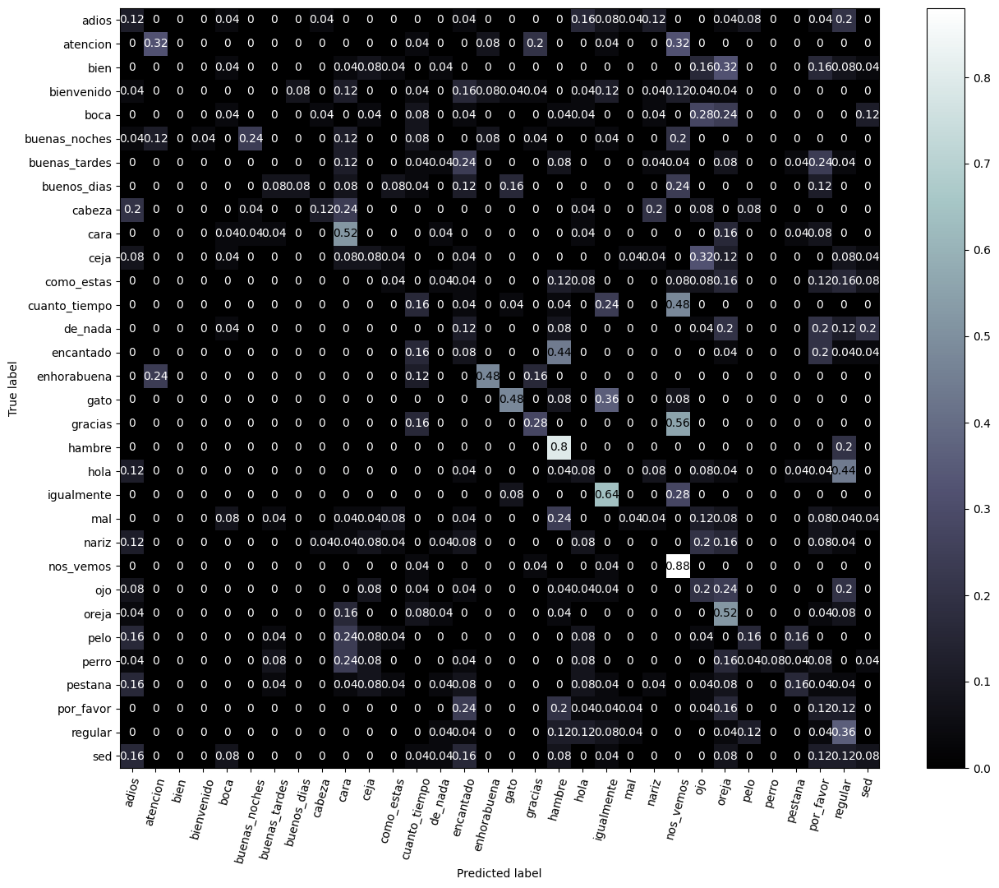

In [ ]:
fig, ax = plt.subplots(figsize=(15,12))
ConfusionMatrixDisplay.from_predictions(
   y_test_lab, y_pred_lab, normalize='true', cmap='bone', xticks_rotation=75, ax=ax)

plt.show()

In [ ]:
print(classification_report(y_test_lab, y_pred_lab))

               precision    recall  f1-score   support

        adios       0.09      0.12      0.10        25
     atencion       0.47      0.32      0.38        25
         bien       0.00      0.00      0.00        25
   bienvenido       0.00      0.00      0.00        25
         boca       0.10      0.04      0.06        25
buenas_noches       0.75      0.24      0.36        25
buenas_tardes       0.00      0.00      0.00        25
  buenos_dias       0.50      0.08      0.14        25
       cabeza       0.50      0.12      0.19        25
         cara       0.25      0.52      0.34        25
         ceja       0.12      0.08      0.10        25
   como_estas       0.10      0.04      0.06        25
cuanto_tiempo       0.14      0.16      0.15        25
      de_nada       0.00      0.00      0.00        25
    encantado       0.05      0.08      0.06        25
  enhorabuena       0.67      0.48      0.56        25
         gato       0.60      0.48      0.53        25
      gra

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Archive Test Evaluation

In [30]:
from keras.models import load_model

In [31]:
n_words = 8

In [32]:
video_path = #copy path to the video

SyntaxError: invalid syntax (3409076885.py, line 1)

In [ ]:
cap = cv2.VideoCapture(video_path)
if cap.isOpened():
  width  = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
  height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
  frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)
  if width != DESIRED_WIDTH or height != DESIRED_HEIGHT or frames != MAX_FRAME_LENGTH:
    print("Modify the resolution or length of the video first.\n")
    print("Width must be 720.\n")
    print("Height must be 480.\n")
    print("Video must be 45 frames long.")

cap.release()
cv2.destroyAllWindows()

In [ ]:
all_landmarks = np.empty((0,1662))
cap = cv2.VideoCapture(video_path)
while (cap.isOpened()):

   with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic: # Setting mediapipe model

        for video_frame in range(MAX_FRAME_LENGTH):

            # Read frames and show
            _, frame = cap.read()

            # Model results prediction
            img, results = detection(frame, holistic)

            all_landmarks = np.append(all_landmarks, get_landmarks(results).reshape(1,1662))

cap.release()
cv2.destroyAllWindows()

In [ ]:
sample = all_landmarks.reshape(1, 45, 1662)

In [ ]:
#model = load_model(os.path.join(ROOT_PATH, "models", str(n_words) + 'S', "v49.h5"))
model = load_model("bestmodel-v1")
Y_pred = model(sample)

In [ ]:
# Get labels from one-hot-encoding
y_pred_lab = np.argmax(Y_pred, axis=1)
y_pred_lab = [signs[pred] for pred in y_pred_lab]

print(y_pred_lab)

# Camera Test Evaluation

In [83]:
from keras.models import load_model

In [84]:
# First run signs mapping for that number of signs
n_words = 8

Testing Camera

In [36]:

capture = cv2.VideoCapture(0)

if capture.isOpened() is False: print("Camera is not available")

with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic: # Setting mediapipe model
    while capture.isOpened():

        # Read frames and show them
        _, frame = capture.read()

        # Model results prediction
        img, results = detection(frame, holistic)

        # Show landmarks
        show_landmarks(img, results)

        cv2.imshow("OpenCV video", img)

        if cv2.waitKey(1) == ord("q"):
            break
    capture.release()
    cv2.destroyAllWindows()

Obtaining parameters from video

In [85]:
camera = cv2.VideoCapture(0)
all_landmarks = np.empty((0,1662))
if camera.isOpened() is False:
    print("Camera is not available.")
else:
    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic: # Setting mediapipe model

        for video_frame in range(MAX_FRAME_LENGTH):

            # Read frames and show
            _, frame = camera.read()

            # Model results prediction
            img, results = detection(frame, holistic)

            # Show landmarks
            show_landmarks(img, results)

            # Capture funtionality
            if video_frame==0:
                cv2.rectangle(img, (0,0), (DESIRED_WIDTH, DESIRED_HEIGHT), (255, 255, 255), -1)
                cv2.putText(img, 'Comenzando captura de Video', (3,30), cv2.FONT_HERSHEY_SIMPLEX, .75, (0,0,0), 1, cv2.LINE_AA)

                resize_and_show('Sign Language Recognition', img)
                cv2.waitKey(2000) # Wait 2sec
            else:
                resize_and_show('Sign Language Recognition', img)

            # Landmarks saving
            all_landmarks = np.append(all_landmarks, get_landmarks(results).reshape(1,1662))

            if cv2.waitKey(1) == ord('q'):
                camera.release()
                cv2.destroyAllWindows()
                break


        camera.release()
        cv2.destroyAllWindows()

In [86]:
sample = all_landmarks.reshape(1, 45, 1662)

In [87]:
#model = load_model(os.path.join(ROOT_PATH, "models", str(n_words) + 'S', "v49.h5"))
model = load_model("bestmodel-v52")
Y_pred = model(sample)

In [88]:
# Get labels from one-hot-encoding
y_pred_lab = np.argmax(Y_pred, axis=1)
y_pred_lab = [signs[pred] for pred in y_pred_lab]

print(y_pred_lab)

['nos_vemos']
